In [157]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time

from sklearn.metrics import rand_score
from typing import Optional
from pydantic import BaseModel, Extra, Field, validate_arguments

In [183]:
def create_dataset(info):
    datasets = []
    n_clusters = []
    labels = []
    
    for name, n_cluster in info: 
        dataset = pd.read_csv('dataset/FCPS/Sets/' + name + '.lrn', sep='\s+').drop('Key', axis=1)
        label = pd.read_csv('dataset/FCPS/Labels/' + name + '.txt', sep='\s+').drop('datapoint', axis=1)
        dataset.name = name
        label.name = name
        datasets.append(dataset)
        n_clusters.append(int(n_cluster))
        labels.append(label)
    return datasets, n_clusters, labels

In [184]:
datasets, n_clusters, labels = create_dataset(np.array([['Hepta', 7], ['Tetra', 4], ['Chainlink', 2], ['Atom', 2],
                                                        ['GolfBall', 1], ['Lsun', 3], ['EngyTime', 2],
                                                        ['Target', 6], ['TwoDiamonds', 2], ['WingNut', 2],
                                                        ['MySet1', 4], ['MySet2', 4]]))

In [185]:
def visualize_result(dataset, n_cluster, label, predict, projection=None, centers=None):    
    fig = plt.figure(figsize=(12, 15)) if projection=='3d' else plt.figure(figsize=(10, 5))     
    
    axes = []
    axes.append(fig.add_subplot(1, 2, 1, projection=projection))
    axes.append(fig.add_subplot(1, 2, 2, projection=projection))
    axes[0].set_title(f'Dataset {dataset.name} Real Label')
    axes[1].set_title(f'Dataset {dataset.name} Predicted Label')
    
    if len(dataset.columns) == 3:
        axes[0].scatter(dataset['C1'], dataset['C2'], dataset['C3'], c=label)
        axes[1].scatter(dataset['C1'], dataset['C2'], dataset['C3'], c=predict)          
    else:
        axes[0].scatter(dataset['C1'], dataset['C2'], c=label)
        axes[1].scatter(dataset['C1'], dataset['C2'], c=predict)
        axes[1].scatter(centers[:, 0], centers[:, 1], marker='+', s=100, c='r')
    plt.savefig("results/FCM-CMA/"+dataset.name+str(time.time())+'.png')
    plt.show()

In [233]:
class FCM(BaseModel):
    
    n_clusters: int = Field(5, ge=1, le=100)
    m: float = Field(2.0, ge=1.0)
    random_state: Optional[int] = None
    trained: bool = Field(False, const=True)

    class Config:
        extra = Extra.allow
        arbitrary_types_allowed = True

    @validate_arguments
    def fit(self, X):
        n_samples = X.shape[0]       
        self.rng = np.random.default_rng(self.random_state)
        self.u, self._centers, J, j, L = FCM._cma(data=X, degree=self.m,
                                            domain=[np.min(X), np.max(X)],
                                            d=X.shape[1], n=self.n_clusters)
        self.u = self.soft_predict(X)
        self._centers = FCM._next_centers(X, self.u, self.m)
        self.trained = True
        return J, j, L

    def soft_predict(self, X):
        temp = FCM._dist(X, self._centers) ** float(2 / (self.m - 1))
        denominator_ = temp.reshape((X.shape[0], 1, -1)).repeat(temp.shape[-1], axis=1)
        temp = temp[:, :, np.newaxis]
        denominator_ = temp / denominator_
        denominator_ = denominator_.sum(2)
        return 1 / denominator_
    
    @staticmethod
    def _next_centers(X, u, m):
        um = u ** m
        uX = X.T @ um
        return (uX / np.sum(um, axis=0)).T

    @validate_arguments
    def predict(self, X):
        if self.is_trained(): 
            X = np.expand_dims(X, axis=0) if len(X.shape) == 1 else X
            return self.soft_predict(X).argmax(axis=-1)

    def is_trained(self):
        if self.trained:
            return True
        raise ReferenceError("You need to train the model. Run `.fit()` method to this.")

    @staticmethod
    def _dist(A, B):
        A = A[:, None, :]
        dist = (A - B) ** 2
        return np.sqrt(np.einsum("ijk->ij", dist))

    @property
    def centers(self):
        if self.is_trained():
            return self._centers

    @property
    def partition_coefficient(self):
        if self.is_trained():
            return np.mean(self.u ** 2)

    @property 
    def partition_entropy_coefficient(self):
        if self.is_trained():
            return -np.mean(self.u * np.log2(self.u))
    
    # ------------------- CMA PART -------------------
    class Chromosome:
        def __init__(self, n_samples, n_clusters, dimension):
            self.u = np.zeros((n_samples, n_clusters))
            self.v = np.zeros((n_clusters, dimension))

        def get_chromosome(self):
            return self.u, self.v

        def get_u(self):
            return self.u

        def get_v(self):
            return self.v

        def set_chromosome(self, u, v):
            self.u = u
            self.v = v
        
    @staticmethod
    def _euclidean_dist(A, B):
        A = A[:, None, :]
        B = B[:, None, :]
        dist = (A - B)**2
        return np.sqrt(np.einsum("ijkl->ijk", dist))
        
    @staticmethod
    def _cost_function(X, U, V, L, m):
        return (((U**m)*FCM._euclidean_dist(X, V)).sum(2)).sum(1)-(L*(U.sum(axis=2)-1)).sum()
    
    @staticmethod
    def _cma(data, degree, domain, d, n):
        # U = S × N, V = N × D
        s = data.shape[0]
        
        # domain
        V_d_min = np.min(domain)
        V_d_max = np.max(domain)
        U_d_min = 0
        U_d_max = 1
        
        # initialize population
        m = FCM.Chromosome(s, n, d)
        m.set_chromosome(u=np.random.uniform(low=U_d_min, high=U_d_max, size=(1, s, n)),
                   v=np.random.uniform(low=V_d_min, high=V_d_max, size=(1, n, d)))
        
        # sigma(U, V)
        sigma = [0.5, 0.3*(V_d_max-V_d_min)] 
        
        # termination parameters
        stop_fitness = 1e-1
        stop_generation = (1e3*(d*n)**2)
        
        # lambda & mu
        LAMBDA = int(4+np.floor(3*np.log(d)))
        MU = int(LAMBDA/2)
        
        # weights
        w = np.log(MU+1/2)-np.log(range(1, (MU)+1)).reshape(MU, 1)
        w = w/np.sum(w)
        
        # step size control parameters 
        mueff = 1/np.sum(w**2)
        cs = (mueff+2)/((d)+mueff+5)
        ds = 1+2*np.maximum(0, np.sqrt(np.abs((mueff-1)/((d)+1)))-1)+cs
        
        # covariance matrix parameters
        alpha = 2
        cc = (4+mueff/(d))/((d)+4+2*mueff/(d))
        c1 = alpha/(((d)+1.3)**2+mueff)
        cmu = np.minimum(1-c1, alpha*((mueff-2+1/mueff)/(((d)+2)**2+alpha*mueff/2)))
        
        # evolution path
        ps = [np.zeros((n, 1)), np.zeros((d, 1))]
        pc = [np.zeros((n, 1)), np.zeros((d, 1))]
        
        # matrices
        update_matrix = 0
        B = [np.eye(n), np.eye(d)]
        D = [np.eye(n), np.eye(d)]
        C = [B[0]@D[0]@(B[0]@D[0]).T,
             B[1]@D[1]@(B[1]@D[1]).T]
        
        # expectation of ||N(0, I)||
        E = (d)**0.5*(1-1/(4*(d))+1/(21*(d)**2))
        
        l = 0.001
        
        J = []
        L = []
        champion = []

        # loop
        population_size = 0
        while population_size < stop_generation:
            
            # generate offspring
            z = [np.random.randn(s*n*LAMBDA).reshape(n, -1),
                 np.random.randn(d*n*LAMBDA).reshape(d, -1)]
            v = [(B[0]@D[0]@z[0]).reshape(-1, s, n),
                 (B[1]@D[1]@z[1]).reshape(-1, n, d)]
           
            # mutation
            x = [m.get_u()+sigma[0]*v[0],
                 m.get_v()+sigma[1]*v[1]]
            
            # check offspring U domain    
            while (x[0] > 1).any() or (x[0] < 0).any():
                z[0] = np.random.randn(s*n*LAMBDA).reshape(n, -1)
                v[0] = (B[0]@D[0]@z[0]).reshape(-1, s, n)
                where_min = np.where(x[0] < 0)
                where_max = np.where(x[0] > 1)
                x[0][where_min] = (m.get_u() + sigma[0]*v[0])[where_min]
                x[0][where_max] = (m.get_u() + sigma[0]*v[0])[where_max]
#             x[0] = x[0] / np.repeat(x[0].sum(axis=2), n, axis=1).reshape(-1, s, n)
            
            # check offspring V domain 
            while (x[1] > V_d_max).any() or (x[1] < V_d_min).any():
                z[1] = np.random.randn(d*n*LAMBDA).reshape(d, -1)
                v[1] = (B[1]@D[1]@z[1]).reshape(-1, n, d)
                where_min = np.where(x[1] < V_d_min)
                where_max = np.where(x[1] > V_d_max)
                x[1][where_min] = (m.get_v() + sigma[1]*v[1])[where_min]
                x[1][where_max] = (m.get_v() + sigma[1]*v[1])[where_max]
            
            # calculate fitness
            fitness = FCM._cost_function(X=data, U=x[0], V=x[1], L=l, m=degree)
            population_size+=LAMBDA
            generation = population_size/LAMBDA             
            
            # select parents by rank
            ranks = np.argsort(np.argsort(fitness.reshape(LAMBDA)))
            selected = [i for i,_ in enumerate(ranks) if ranks[i] < MU]
             
            # recombination
            m.set_chromosome((x[0][selected].T@w).reshape(-1, s, n),
                       (x[1][selected].T@w).reshape(-1, n, d))
            z = [z[0].reshape(-1, s, n), z[1].reshape(-1, n, d)]
            y = [(z[0][selected].T@w).reshape(n, -1),
                 (z[1][selected].T@w).reshape(d, -1)]
             
            # update evolution paths
            ps = [(1-cs)*ps[0]+(np.sqrt(cs*(2-cs)*mueff))*(B[0]@y[0]),
                  (1-cs)*ps[1]+(np.sqrt(cs*(2-cs)*mueff))*(B[1]@y[1])]
            hs = [np.minimum(np.linalg.norm(ps[0])/np.sqrt(1-(1-cs)**(2*population_size/LAMBDA))/E, 1.4+2/((d*n)+1)),
                  np.minimum(np.linalg.norm(ps[1])/np.sqrt(1-(1-cs)**(2*population_size/LAMBDA))/E, 1.4+2/((d*n)+1))]
            pc = [(1-cc)*pc[0]+hs[0]*np.sqrt(cc*(2-cc)*mueff)*(B[0]@D[0]@y[0]),
                  (1-cc)*pc[1]+hs[1]*np.sqrt(cc*(2-cc)*mueff)*(B[1]@D[1]@y[1])]
           
            # update covariance matrix C
            M = [B[0]@D[0]@z[0][selected].reshape(n, -1),
                 B[1]@D[1]@z[1][selected].reshape(d, -1)]
            C = [(1-c1-cmu)*C[0]+c1*(pc[0]@pc[0].T+(1-hs[0])*cc*(2-cc)*C[0])+cmu*M[0]*np.diag(w)@M[0].T,
                 (1-c1-cmu)*C[1]+c1*(pc[1]@pc[1].T+(1-hs[1])*cc*(2-cc)*C[1])+cmu*M[1]*np.diag(w)@M[1].T]
            
            # update step-size
            sigma = [sigma[0]*np.exp((cs/ds)*(np.linalg.norm(ps[0])/E-1)),
                     sigma[1]*np.exp((cs/ds)*(np.linalg.norm(ps[1])/E-1))]
            
            # update B and D from C
            cone = 0
            if population_size-update_matrix > LAMBDA/(cone+cmu)/(d)/10:
                update_matrix = population_size
                C = [np.triu(C[0]) + np.triu(C[0], 1).T,
                     np.triu(C[1]) + np.triu(C[1], 1).T]
                B[0], D[0] = np.linalg.eig(C[0])
                B[1], D[1] = np.linalg.eig(C[1])
                B = [B[0]*np.eye(n), B[1]*np.eye(d)]
                D = [np.diag(np.sqrt(np.abs(np.diag(D[0]).reshape(-1, 1))))*np.eye(n),
                     np.diag(np.sqrt(np.abs(np.diag(D[1]).reshape(-1, 1))))*np.eye(d)]
           
            best_J = np.min(fitness[selected])
            i = np.where(best_J == fitness[ranks])
            
            L.append(l)

#             update parameter l
            l = 1.001*l
#             if generation % 10 != 0:
#                 champion.append(x[0][ranks[i]])
#             if generation % 10 == 0:
#                 feasible = False
#                 for j in range(len(champion)):
#                     if (champion[j].sum(2)-1).sum()==0:
#                         feasible = True
#                 if feasible:
#                     l = l*0.75
#                 else:
#                     l = l/0.75
#                 champion = []
             
            J.append(best_J)

            if best_J <= stop_fitness:
                break
             
            if best_J == fitness[int(np.ceil(0.7*LAMBDA))]:
                sigma = [sigma[0] * np.exp(0.2+cs/ds), sigma[1] * np.exp(0.2+cs/ds)]
             
            # check sigma U bound
            if sigma[0] > U_d_max:
                B[0] = np.eye(n) 
                D[0] = np.eye(n)
                C[0] = B[0]@D[0]@(B[0]@D[0]).T
                ps[0] = np.zeros((n, 1))
                pc[0] = np.zeros((n, 1))
                sigma[0] = 0.5
             
            # check sigma V bound
            if sigma[1] > V_d_max:
                B[1] = np.eye(d) 
                D[1] = np.eye(d)
                C[1] = B[1]@D[1]@(B[1]@D[1]).T
                ps[1] = np.zeros((d, 1))
                pc[1] = np.zeros((d, 1))
                sigma[1] = 0.3*(V_d_max-V_d_min)
             
        x[0] = x[0] / np.repeat(x[0].sum(axis=2), n, axis=1).reshape(-1, s, n)       
        return x[0][ranks[i[0][0]]].reshape(s, n), x[1][ranks[i[0][0]]].reshape(n, d), J, best_J, L

In [234]:
def visualize_cost_function(J, j, dataset):    
    if j == 0:
        plt.plot(range(len(J)), J, 'r-')
        plt.xlabel('generation')
        plt.ylabel('L')
        plt.title('L parameter for '+ dataset)
    else:
        print('final cost function J=', j)
        plt.plot(range(len(J)), J, 'b-')
        plt.xlabel('generation')
        plt.ylabel('J')
        plt.title(dataset + ' cost function')
    plt.savefig("results/FCM-CMA/"+dataset+str(time.time())+'.png')
    plt.show()

In [235]:
def log_result(dataset, execution_time, rand_score, j):
    f = open("results/FCM-CMA/"+dataset+".txt", "a")        
    f.write('dataset: '+dataset+'\n'+
            '--- cost function: '+str(j)+' ---\n'+
            '--- execution time: '+str(execution_time)+' seconds ---\n'+
            '--- rand index score: '+str(rand_score)+' ---\n\n')
    f.close()

final cost function J= 1.9211439455337962


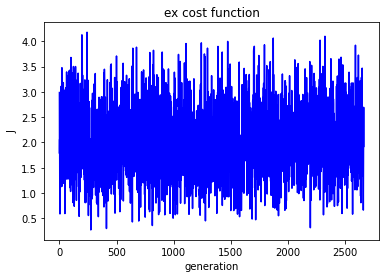

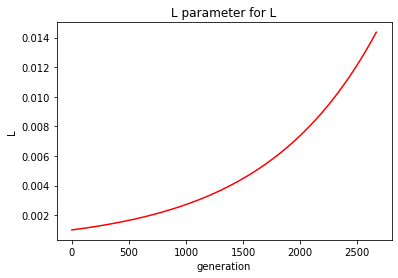

--- rand index score: 1.0 seconds ---


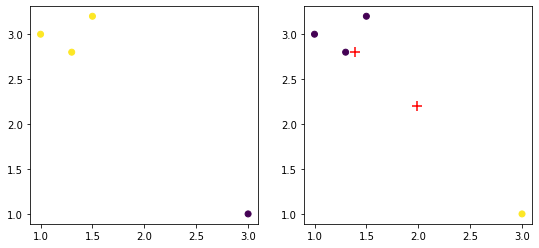

<Figure size 432x288 with 0 Axes>

In [236]:
X = np.concatenate((
    np.array([[1, 3]]),
    np.array([[1.5, 3.2]]),
    np.array([[1.3, 2.8]]),
    np.array([[3, 1]])
))
fcm = FCM(n_clusters=2, m=2)
J, j, L = fcm.fit(X)
fcm_labels = fcm.predict(X)
fcm_centers = fcm.centers
visualize_cost_function(J, j, 'ex')
visualize_cost_function(L, 0, 'L')
f, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].scatter(X[:, 0], X[:, 1], c=[1, 1, 1, 0])
axes[1].scatter(X[:, 0], X[:, 1], c=fcm_labels)
axes[1].scatter(fcm_centers[:, 0], fcm_centers[:, 1], marker='+', s=100, c='r')
print("--- rand index score: %s seconds ---" % (rand_score([1, 1, 1, 0], fcm_labels)))
plt.show()
plt.savefig("results/FCM-CMA/"+str(time.time())+'.png')

1


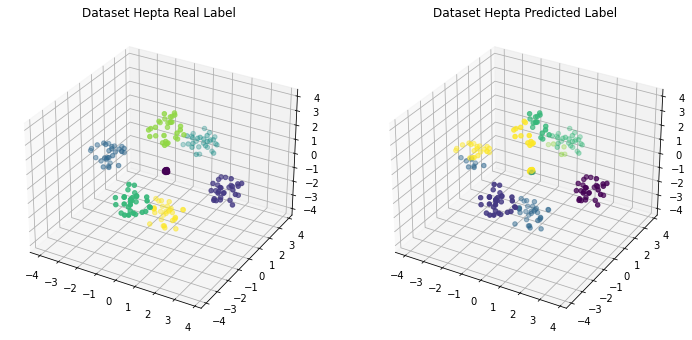

dataset Hepta --- execution time: 86.78417444229126 seconds --- 
dataset Hepta --- rand index score: 0.8848251810784226 seconds --- 
final cost function J= -7.582994360858038


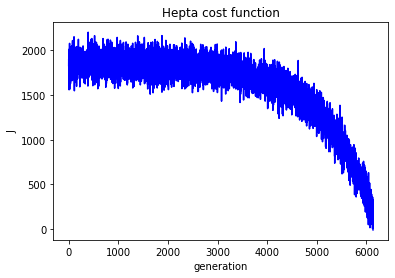

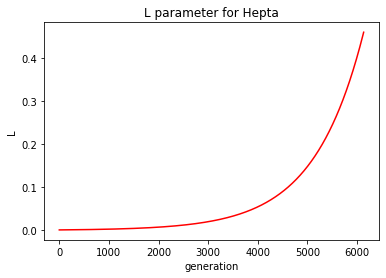

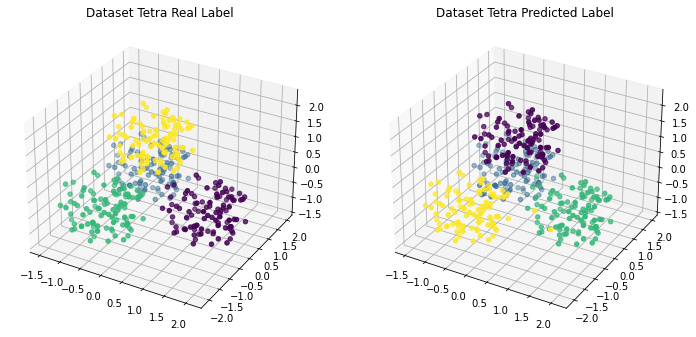

dataset Tetra --- execution time: 84.18425631523132 seconds --- 
dataset Tetra --- rand index score: 0.9781203007518797 seconds --- 
final cost function J= -43.657599836367126


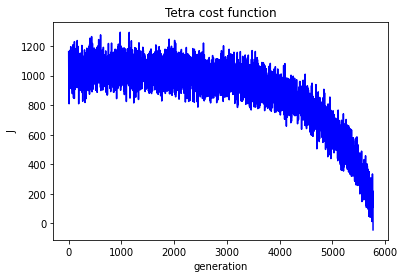

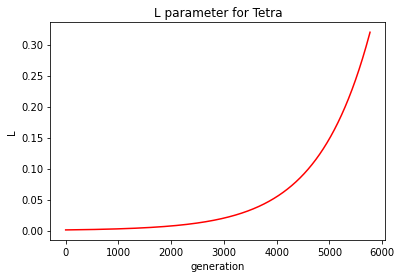

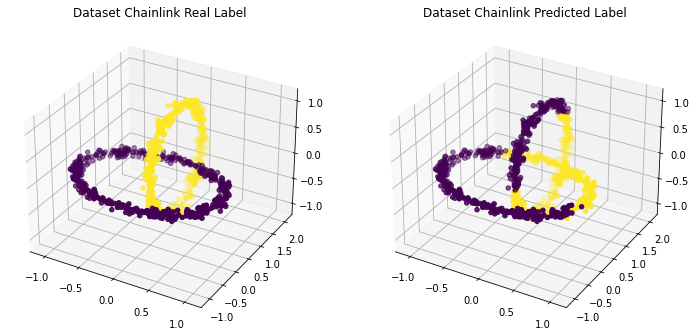

dataset Chainlink --- execution time: 91.21715140342712 seconds --- 
dataset Chainlink --- rand index score: 0.5269049049049049 seconds --- 
final cost function J= 671.0215871030238


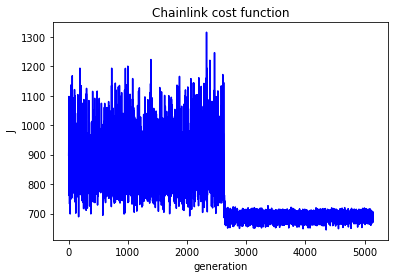

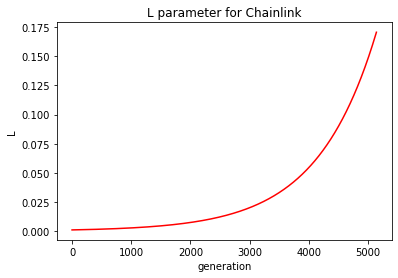

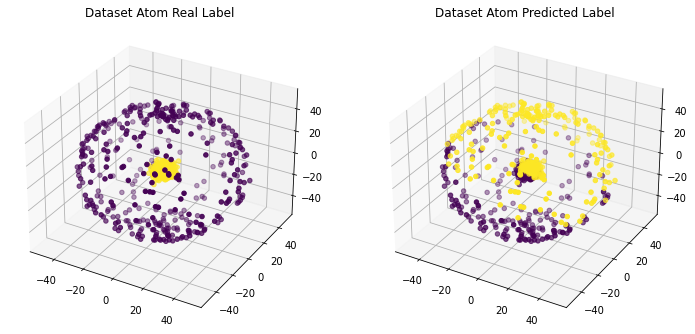

dataset Atom --- execution time: 73.98885416984558 seconds --- 
dataset Atom --- rand index score: 0.4998247809762203 seconds --- 
final cost function J= 15043.421280302327


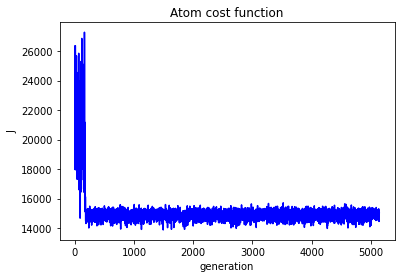

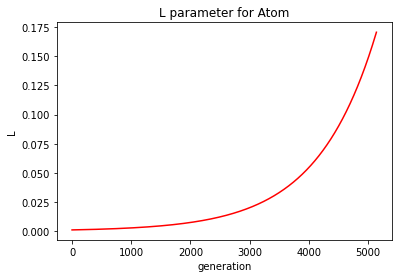

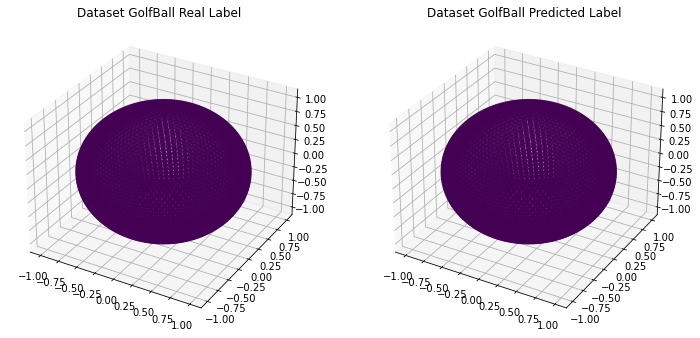

dataset GolfBall --- execution time: 43.989428997039795 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1337.5777838189686


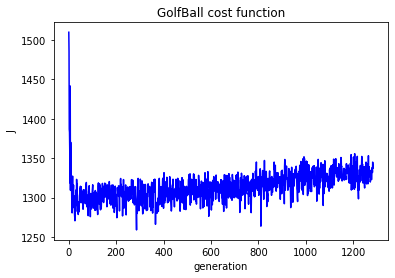

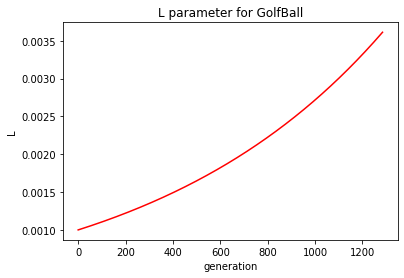

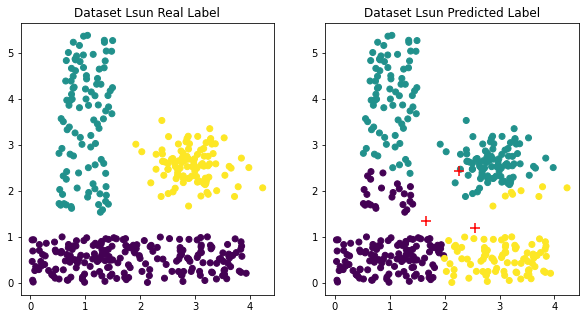

dataset Lsun --- execution time: 67.00522017478943 seconds --- 
dataset Lsun --- rand index score: 0.7139473684210527 seconds --- 
final cost function J= 339.4315783905739


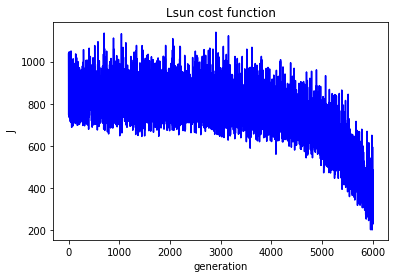

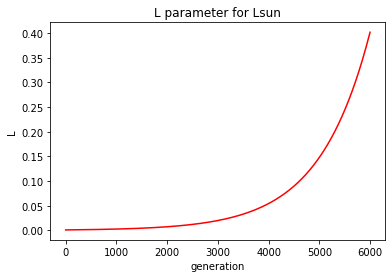

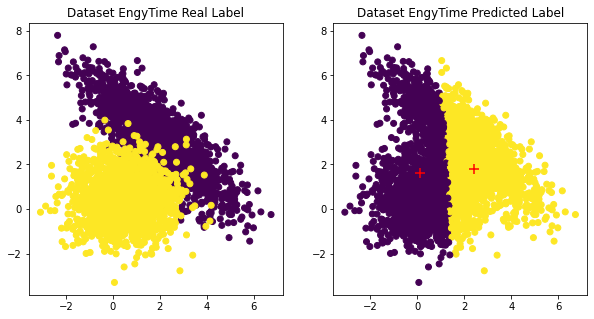

dataset EngyTime --- execution time: 166.01871275901794 seconds --- 
dataset EngyTime --- rand index score: 0.6415450434981685 seconds --- 
final cost function J= 9883.26646200754


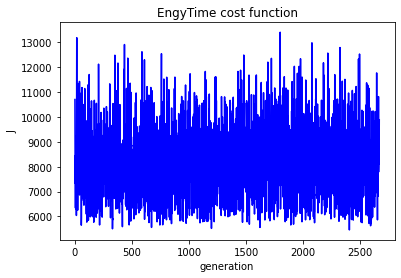

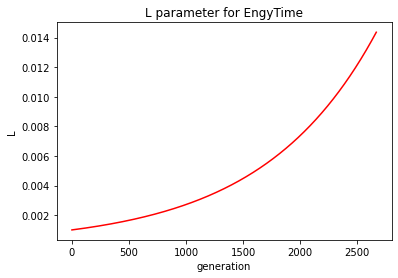

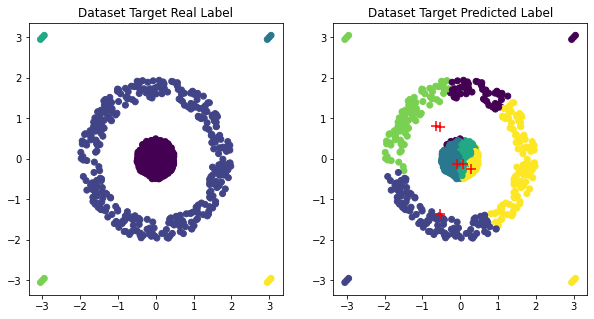

dataset Target --- execution time: 196.8856966495514 seconds --- 
dataset Target --- rand index score: 0.6224511509296945 seconds --- 
final cost function J= -36.773332518618645


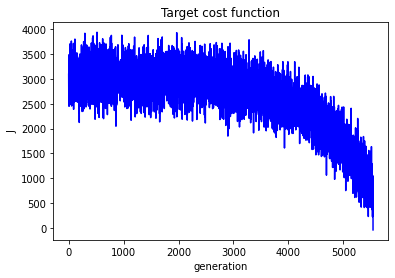

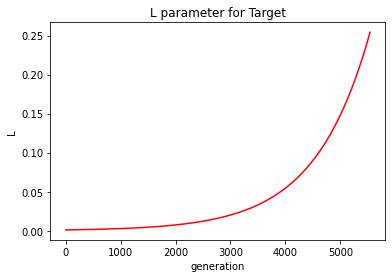

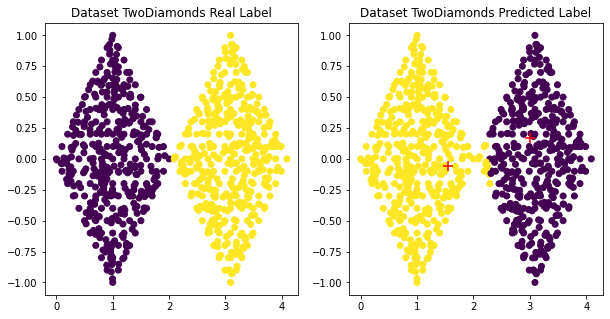

dataset TwoDiamonds --- execution time: 36.89331364631653 seconds --- 
dataset TwoDiamonds --- rand index score: 0.9704130162703379 seconds --- 
final cost function J= 681.7732478491946


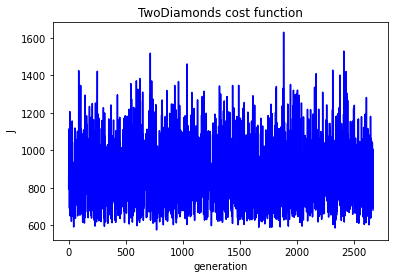

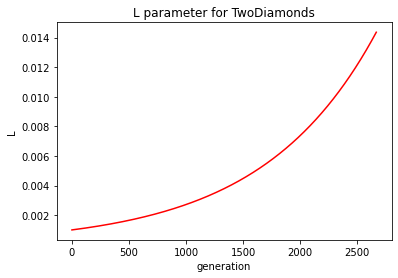

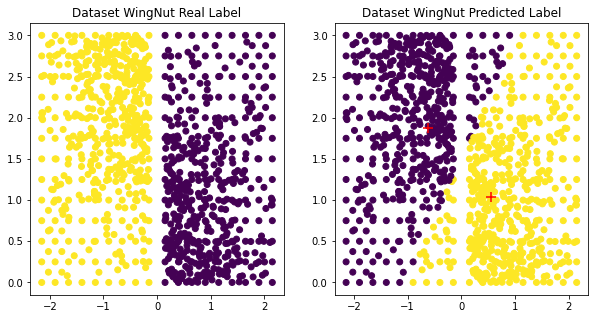

dataset WingNut --- execution time: 44.54863429069519 seconds --- 
dataset WingNut --- rand index score: 0.8818354602226446 seconds --- 
final cost function J= 934.5760232981959


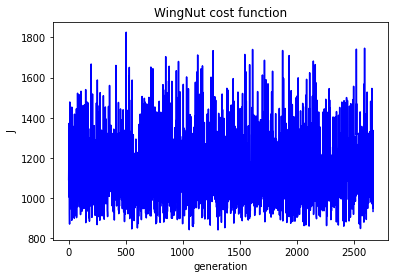

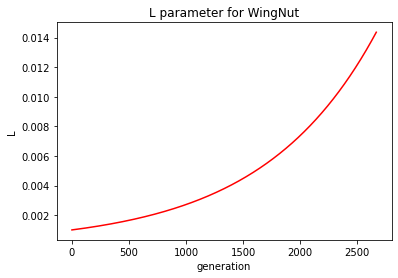

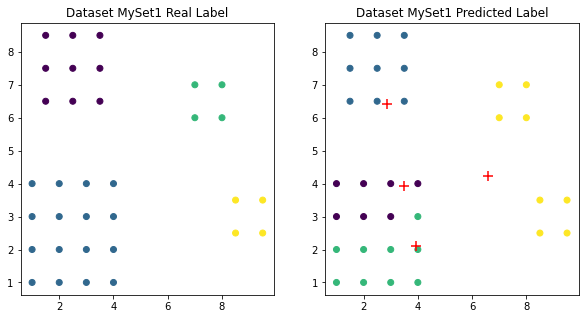

dataset MySet1 --- execution time: 28.295401096343994 seconds --- 
dataset MySet1 --- rand index score: 0.8503787878787878 seconds --- 
final cost function J= -0.307028140714408


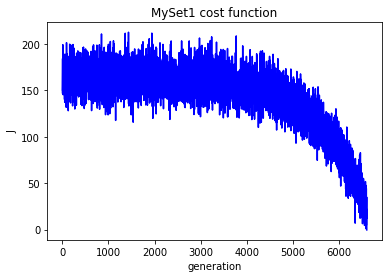

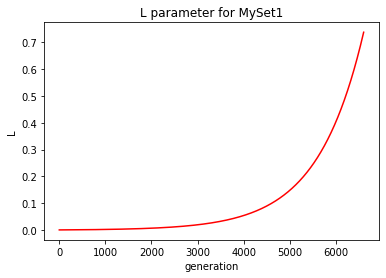

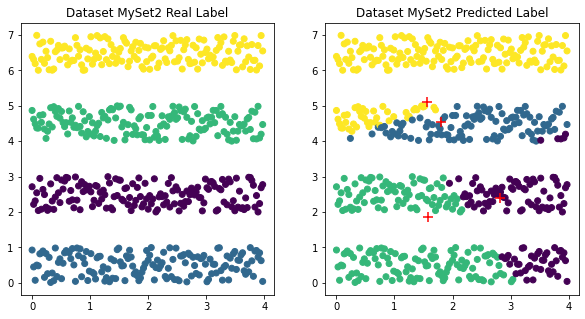

dataset MySet2 --- execution time: 122.07056832313538 seconds --- 
dataset MySet2 --- rand index score: 0.8147523650528659 seconds --- 
final cost function J= -88.40572868836739


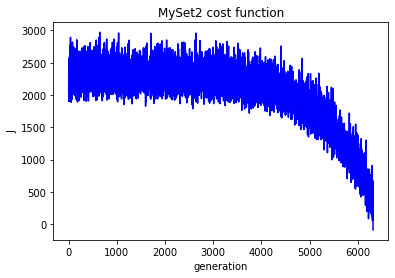

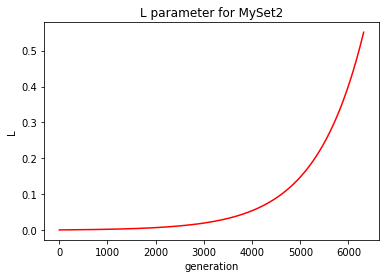

2


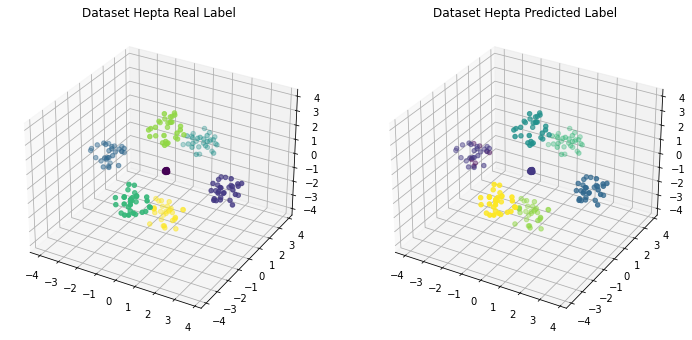

dataset Hepta --- execution time: 87.62939691543579 seconds --- 
dataset Hepta --- rand index score: 0.9606545649646785 seconds --- 
final cost function J= -36.97833259933145


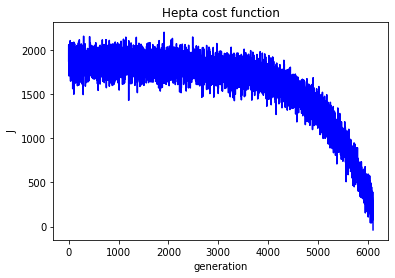

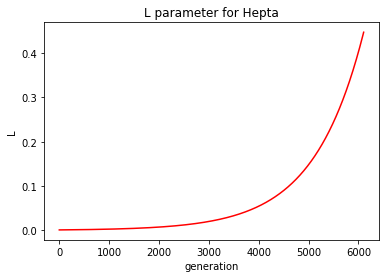

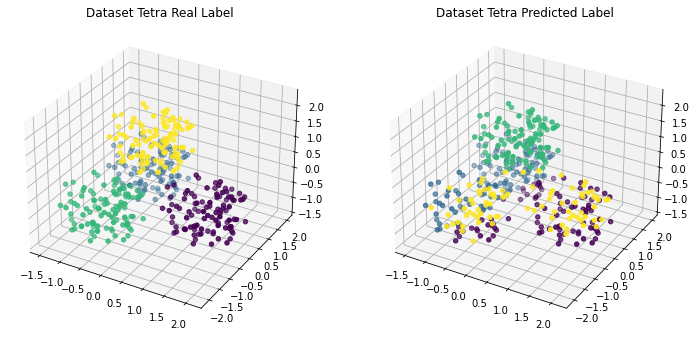

dataset Tetra --- execution time: 87.44228410720825 seconds --- 
dataset Tetra --- rand index score: 0.8147243107769424 seconds --- 
final cost function J= -21.156749379258827


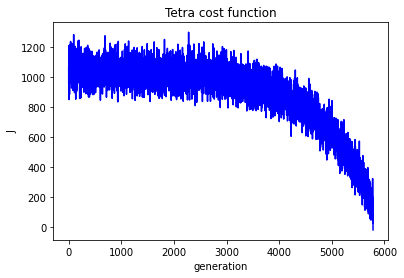

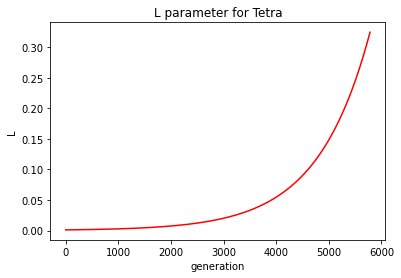

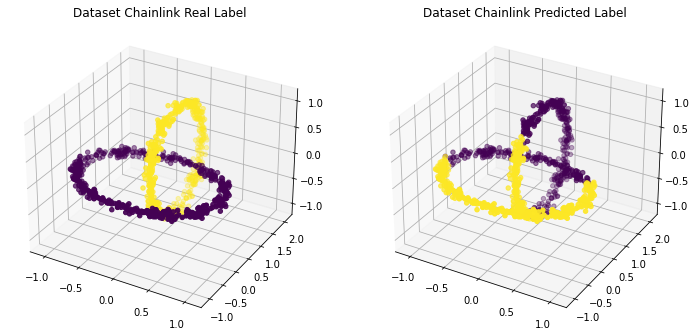

dataset Chainlink --- execution time: 92.80399894714355 seconds --- 
dataset Chainlink --- rand index score: 0.5494774774774774 seconds --- 
final cost function J= 715.18265513327


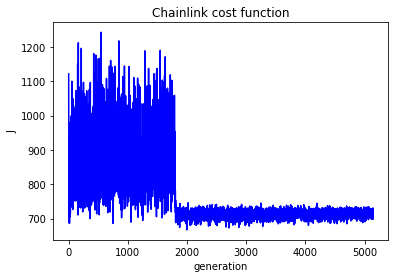

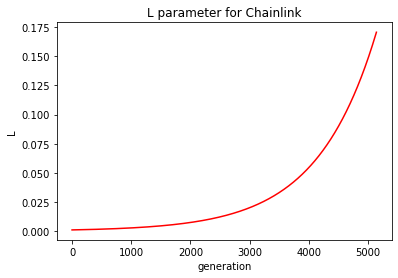

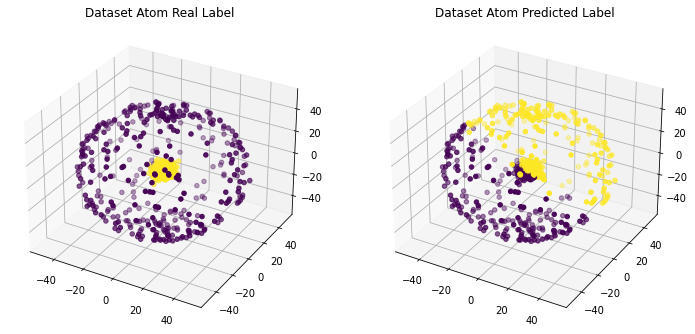

dataset Atom --- execution time: 74.23517227172852 seconds --- 
dataset Atom --- rand index score: 0.5027816020025031 seconds --- 
final cost function J= 14474.309483250614


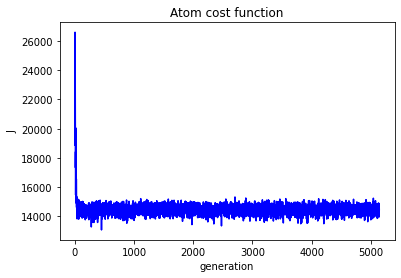

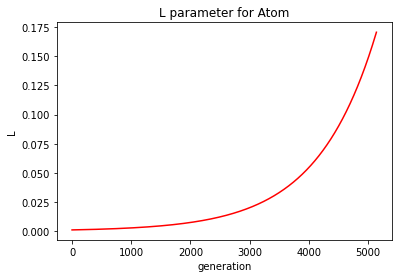

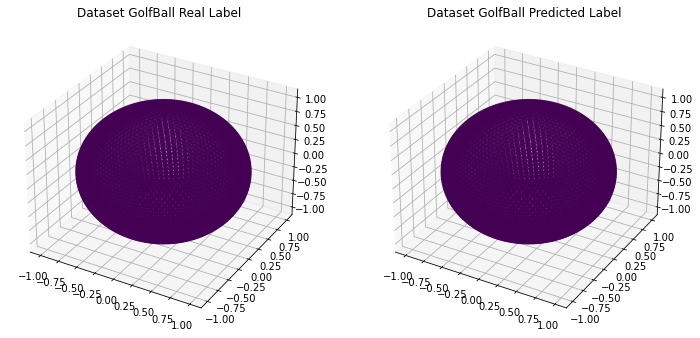

dataset GolfBall --- execution time: 46.320979833602905 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1317.8378471439748


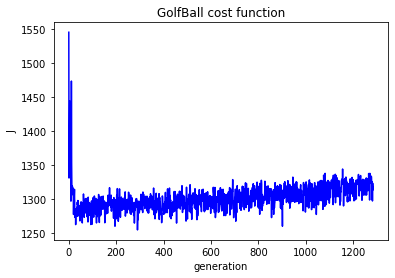

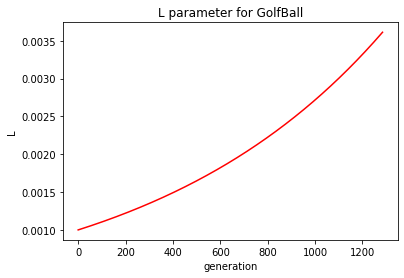

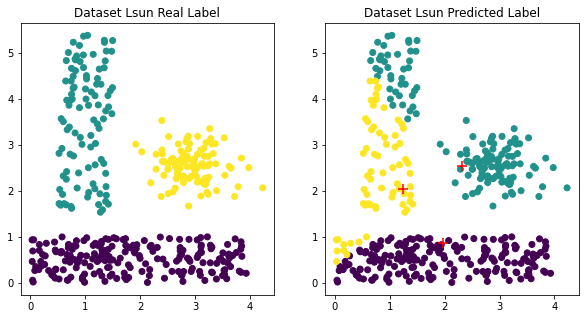

dataset Lsun --- execution time: 64.97429323196411 seconds --- 
dataset Lsun --- rand index score: 0.885764411027569 seconds --- 
final cost function J= 245.79278236575408


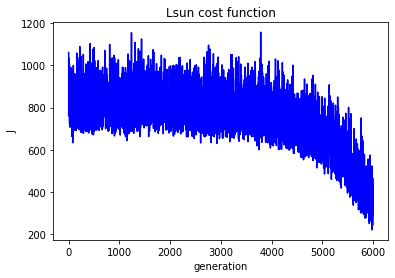

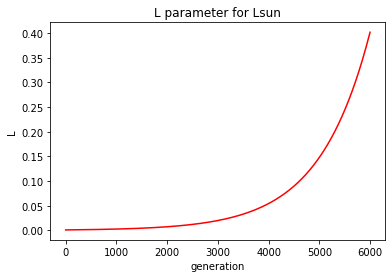

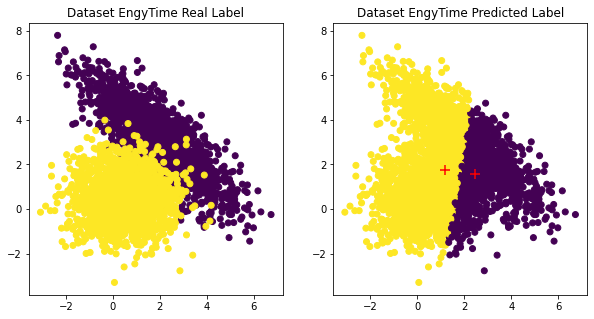

dataset EngyTime --- execution time: 160.45953512191772 seconds --- 
dataset EngyTime --- rand index score: 0.5674871461004274 seconds --- 
final cost function J= 10863.195608050608


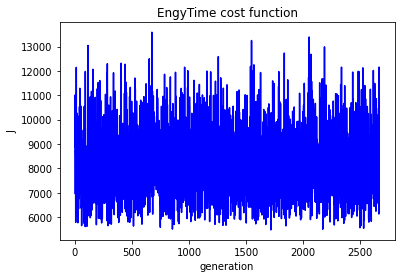

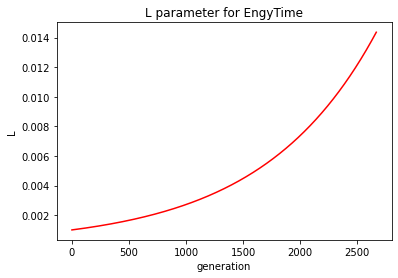

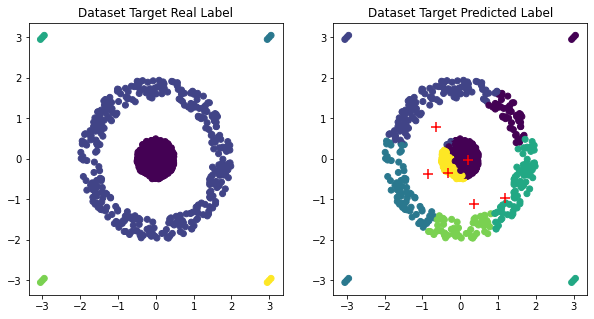

dataset Target --- execution time: 182.31237483024597 seconds --- 
dataset Target --- rand index score: 0.6537685981119011 seconds --- 
final cost function J= -139.14482805287253


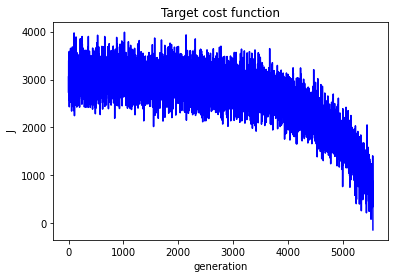

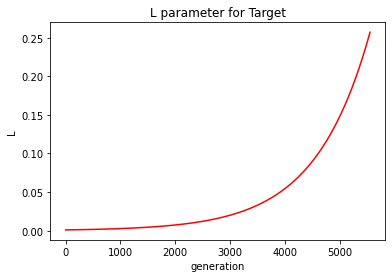

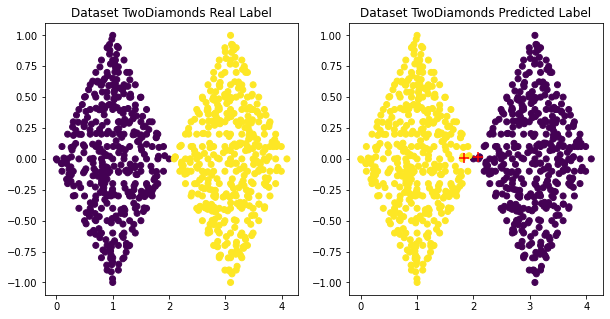

dataset TwoDiamonds --- execution time: 33.48297739028931 seconds --- 
dataset TwoDiamonds --- rand index score: 0.9975 seconds --- 
final cost function J= 915.7730104421995


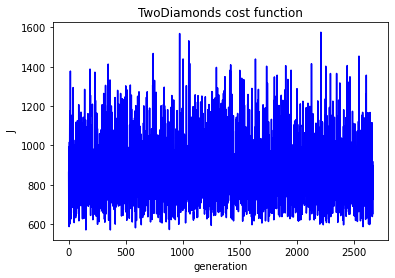

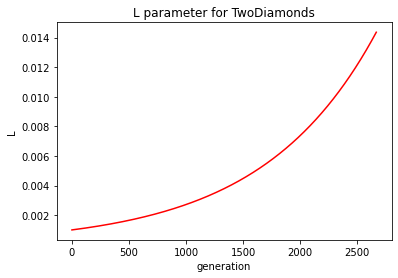

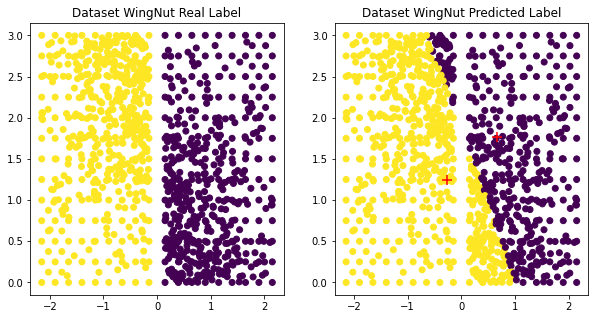

dataset WingNut --- execution time: 41.797409534454346 seconds --- 
dataset WingNut --- rand index score: 0.6943970365773244 seconds --- 
final cost function J= 999.052829235573


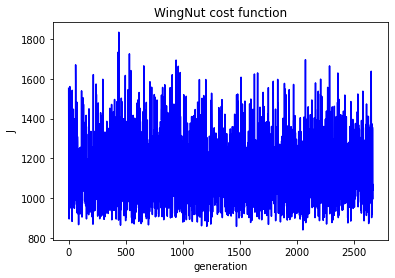

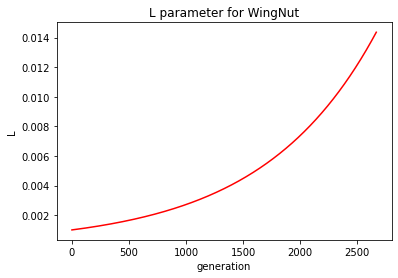

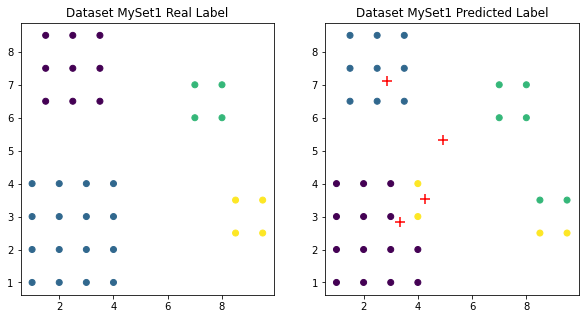

dataset MySet1 --- execution time: 28.929004669189453 seconds --- 
dataset MySet1 --- rand index score: 0.9166666666666666 seconds --- 
final cost function J= -8.600991177578209


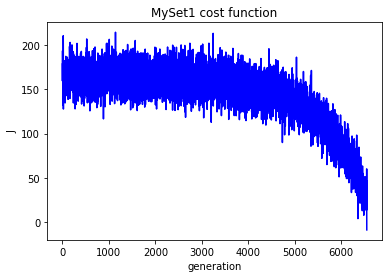

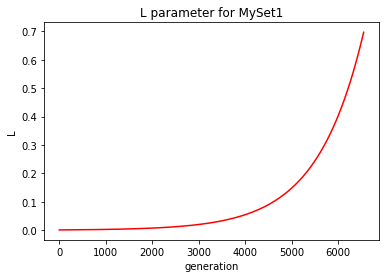

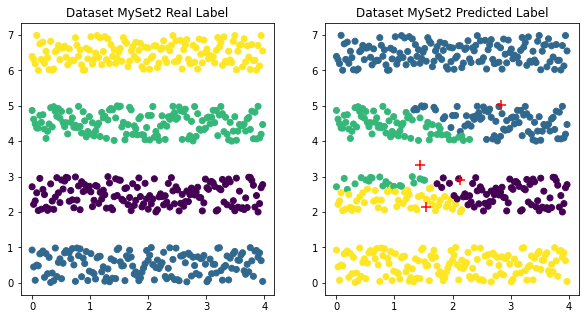

dataset MySet2 --- execution time: 119.21034812927246 seconds --- 
dataset MySet2 --- rand index score: 0.810534223706177 seconds --- 
final cost function J= -74.30267369035141


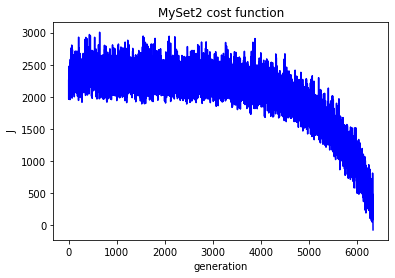

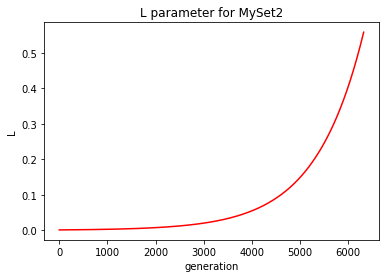

3


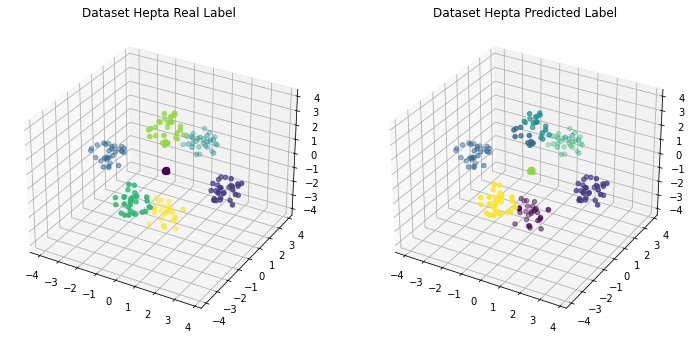

dataset Hepta --- execution time: 84.61721467971802 seconds --- 
dataset Hepta --- rand index score: 0.9678529911472771 seconds --- 
final cost function J= -101.53386198510407


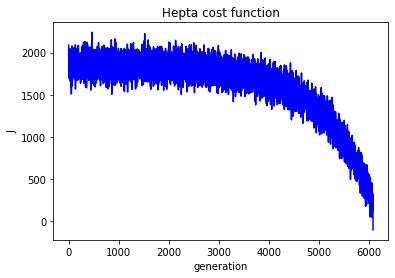

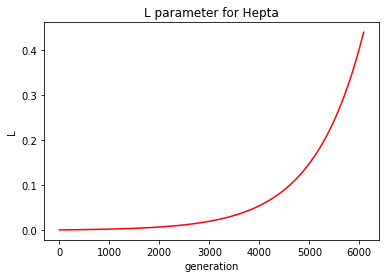

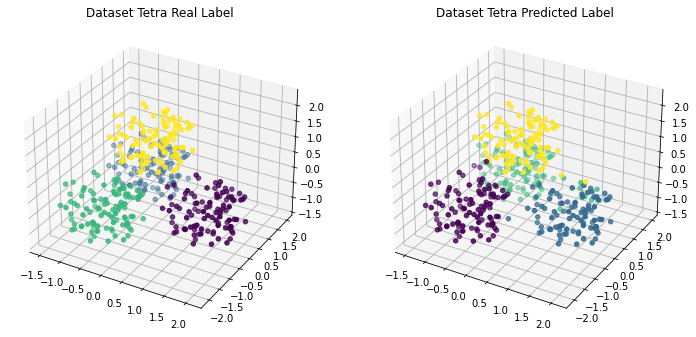

dataset Tetra --- execution time: 79.12973380088806 seconds --- 
dataset Tetra --- rand index score: 0.9618421052631579 seconds --- 
final cost function J= -110.71922800390803


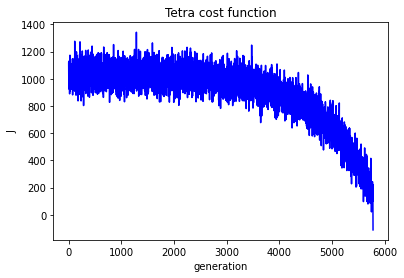

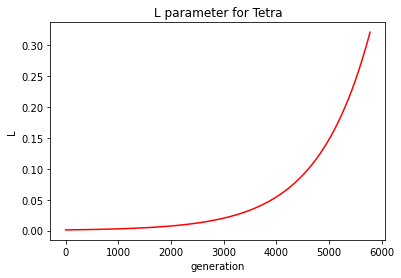

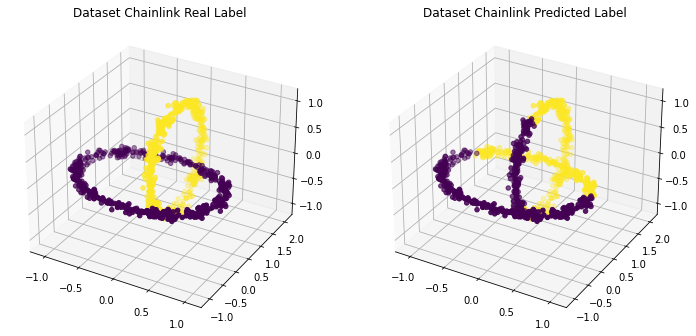

dataset Chainlink --- execution time: 85.75673604011536 seconds --- 
dataset Chainlink --- rand index score: 0.5421741741741741 seconds --- 
final cost function J= 703.4712979822681


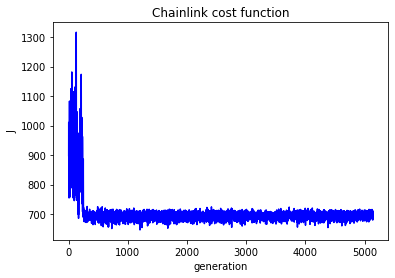

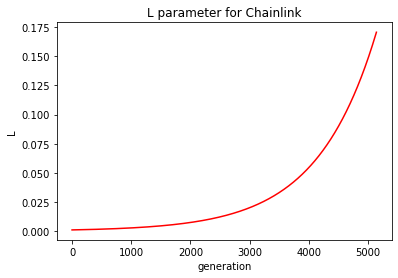

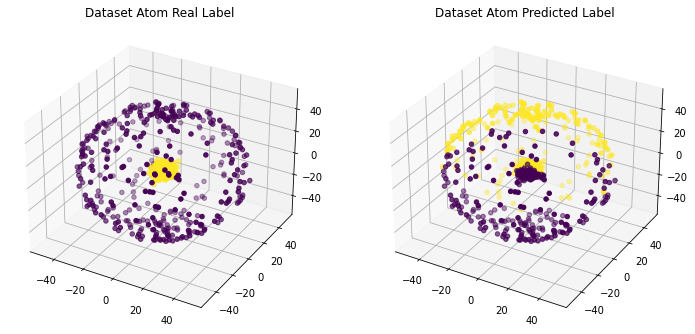

dataset Atom --- execution time: 70.47077322006226 seconds --- 
dataset Atom --- rand index score: 0.5071964956195244 seconds --- 
final cost function J= 13872.435142495235


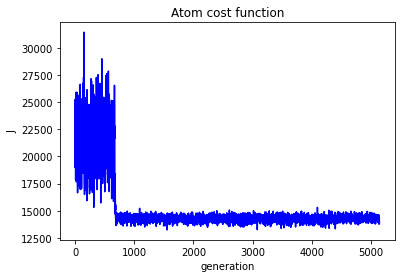

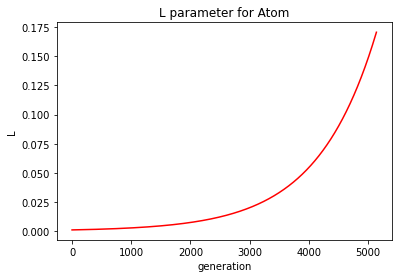

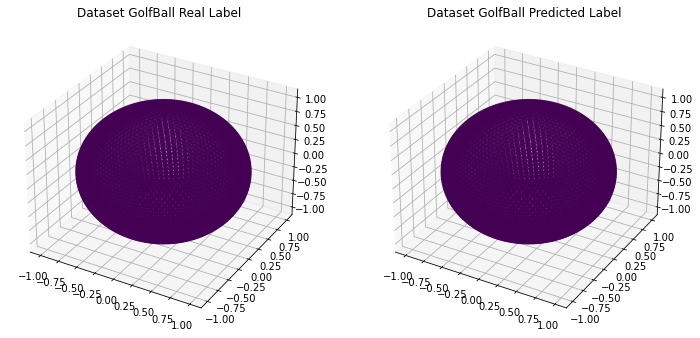

dataset GolfBall --- execution time: 46.22042179107666 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1321.4456917452908


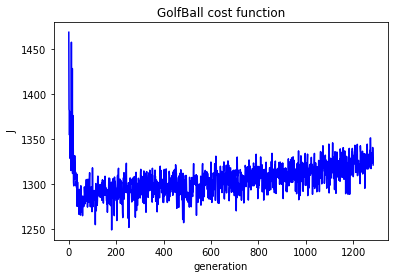

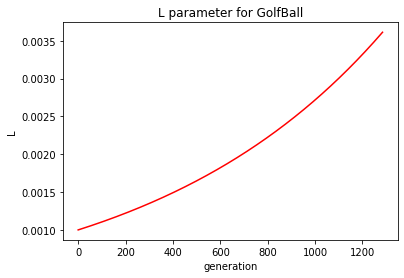

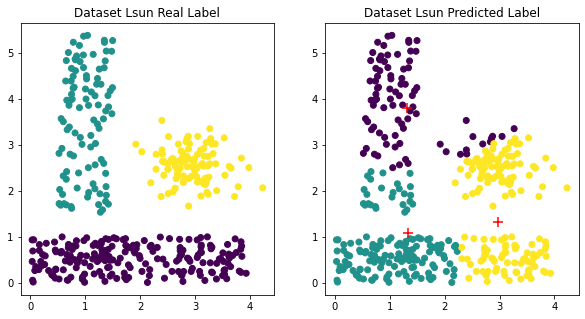

dataset Lsun --- execution time: 62.70994162559509 seconds --- 
dataset Lsun --- rand index score: 0.7110902255639098 seconds --- 
final cost function J= 298.89977421848084


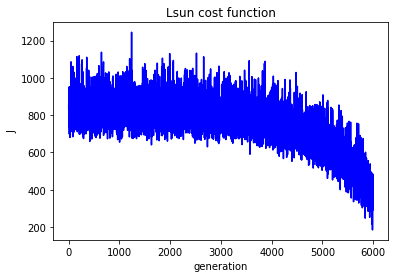

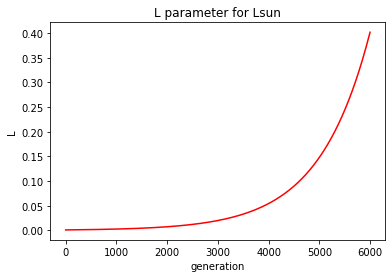

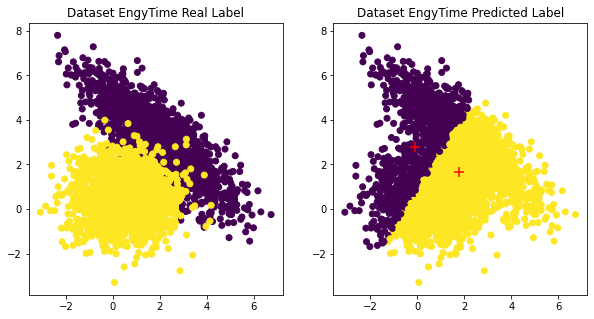

dataset EngyTime --- execution time: 158.47688603401184 seconds --- 
dataset EngyTime --- rand index score: 0.503283467834249 seconds --- 
final cost function J= 9093.480621033856


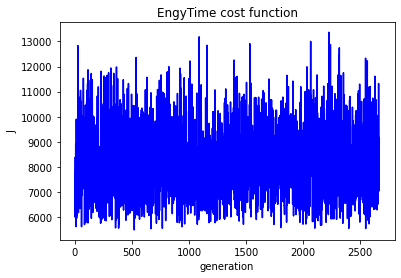

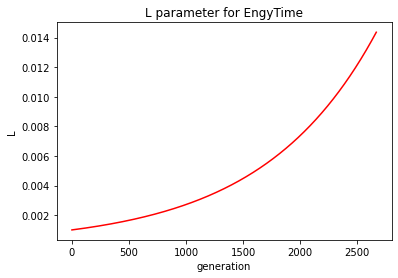

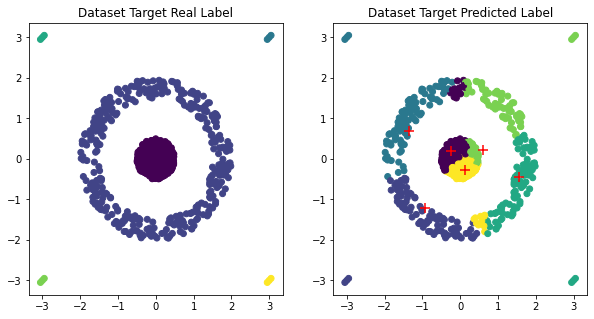

dataset Target --- execution time: 193.95113062858582 seconds --- 
dataset Target --- rand index score: 0.6380153006941043 seconds --- 
final cost function J= -167.2829423163621


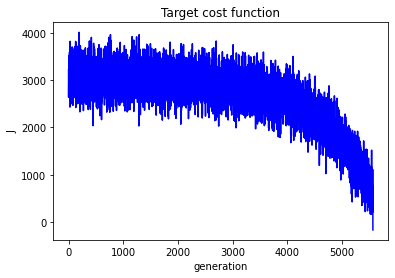

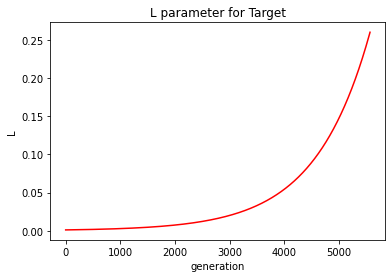

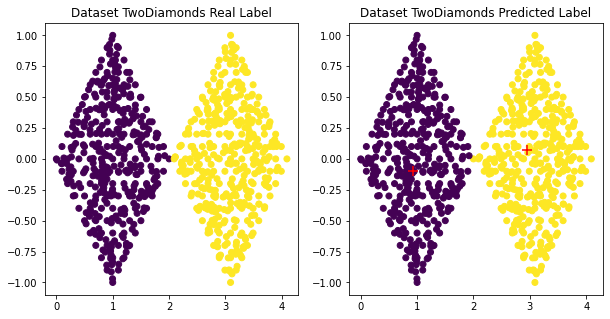

dataset TwoDiamonds --- execution time: 13.33534550666809 seconds --- 
dataset TwoDiamonds --- rand index score: 0.9975 seconds --- 
final cost function J= 1029.9847623537378


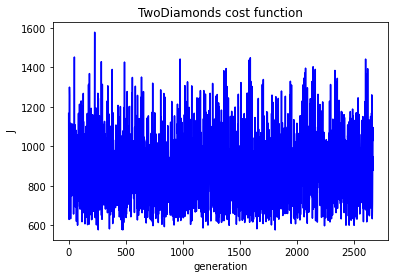

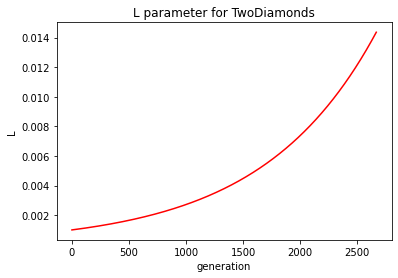

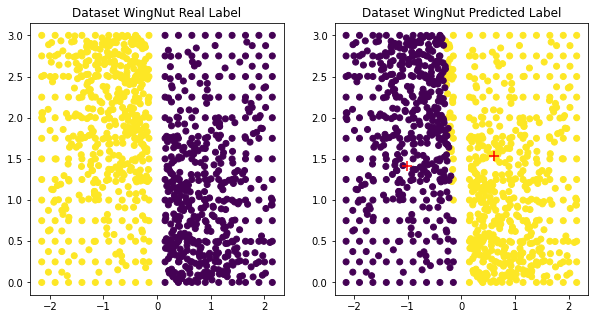

dataset WingNut --- execution time: 16.941741704940796 seconds --- 
dataset WingNut --- rand index score: 0.9224719754858229 seconds --- 
final cost function J= 1131.603181492727


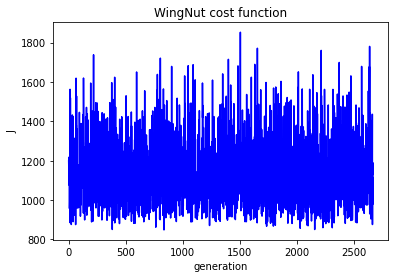

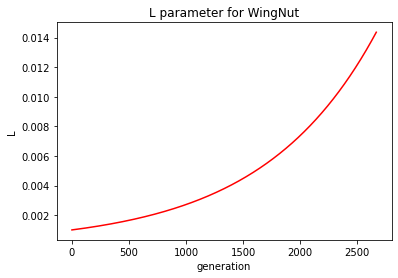

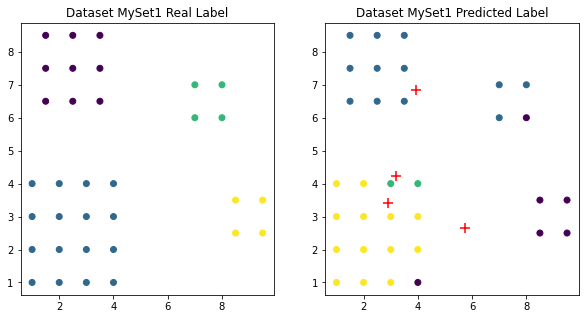

dataset MySet1 --- execution time: 10.25061845779419 seconds --- 
dataset MySet1 --- rand index score: 0.8484848484848485 seconds --- 
final cost function J= -9.123927047196162


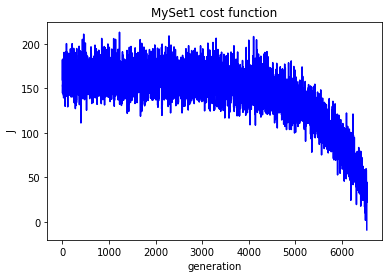

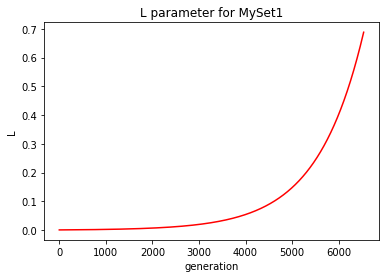

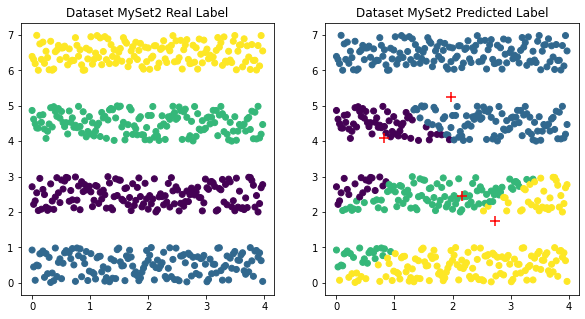

dataset MySet2 --- execution time: 47.22864484786987 seconds --- 
dataset MySet2 --- rand index score: 0.8004062326099054 seconds --- 
final cost function J= -72.27379801052098


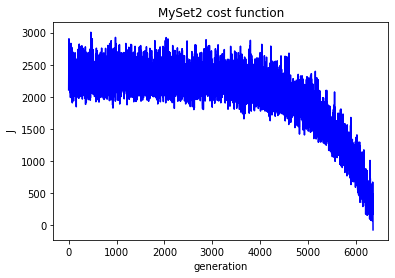

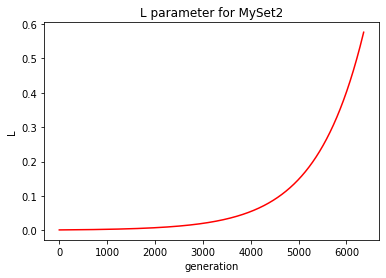

4


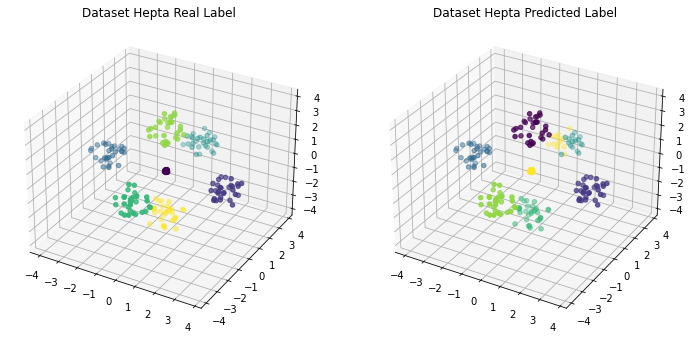

dataset Hepta --- execution time: 32.35533046722412 seconds --- 
dataset Hepta --- rand index score: 0.971519270321023 seconds --- 
final cost function J= -26.227118566668423


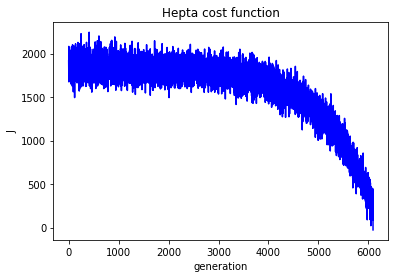

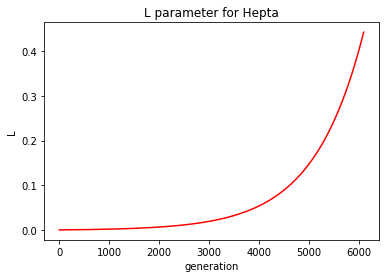

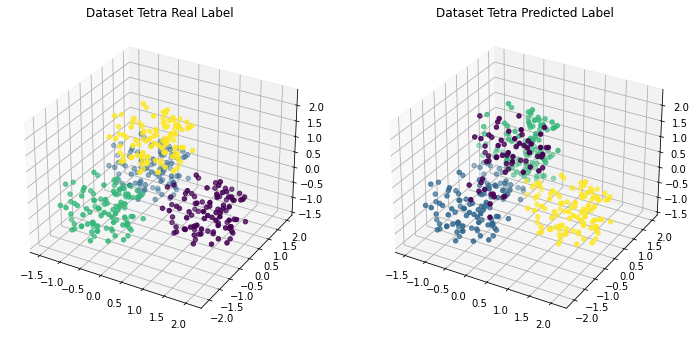

dataset Tetra --- execution time: 31.719698905944824 seconds --- 
dataset Tetra --- rand index score: 0.8322431077694236 seconds --- 
final cost function J= -6.325812297063067


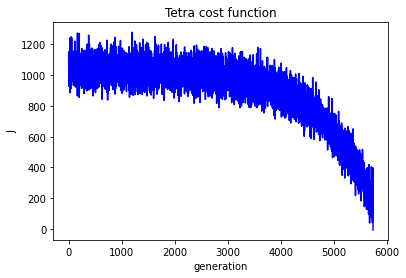

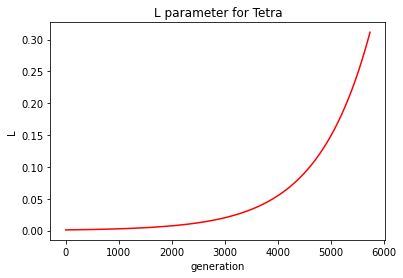

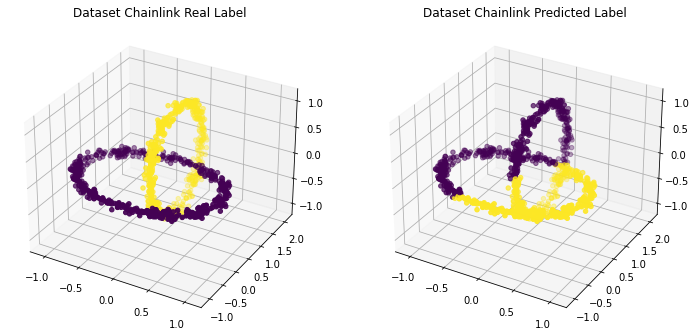

dataset Chainlink --- execution time: 34.63294434547424 seconds --- 
dataset Chainlink --- rand index score: 0.5025445445445446 seconds --- 
final cost function J= 765.5760813975438


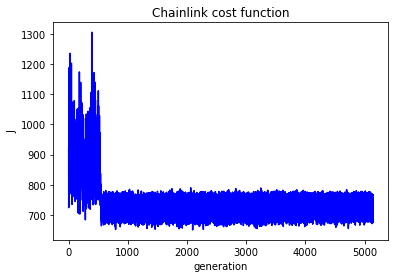

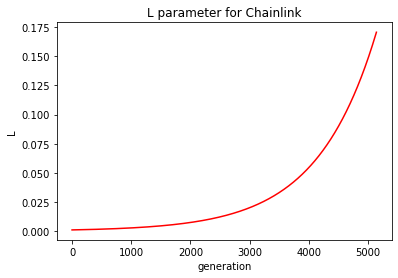

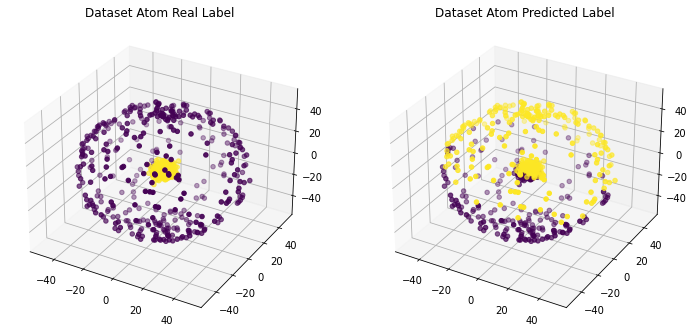

dataset Atom --- execution time: 28.318240642547607 seconds --- 
dataset Atom --- rand index score: 0.5027816020025031 seconds --- 
final cost function J= 14525.954812773443


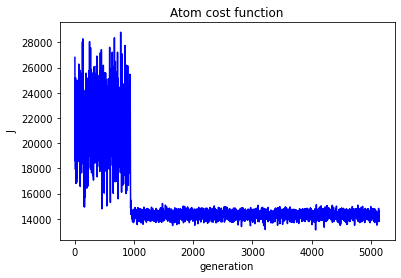

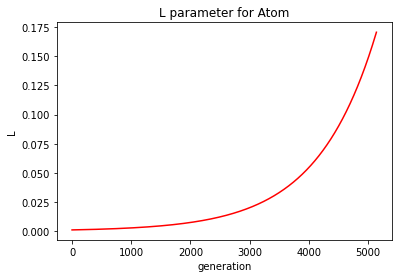

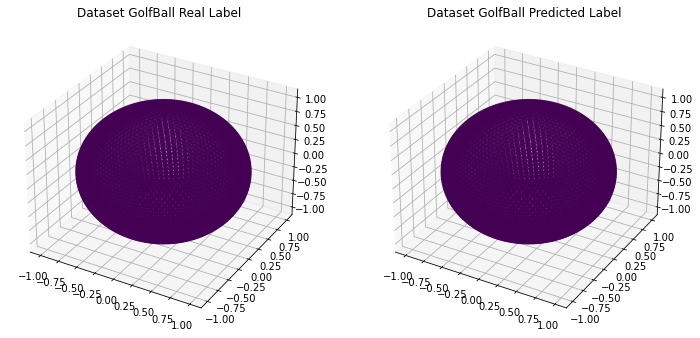

dataset GolfBall --- execution time: 19.097386598587036 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1313.2176210858368


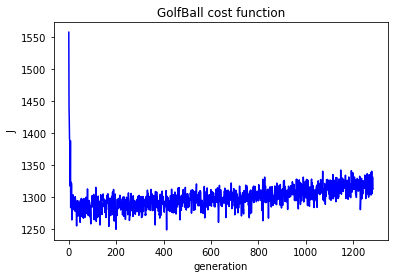

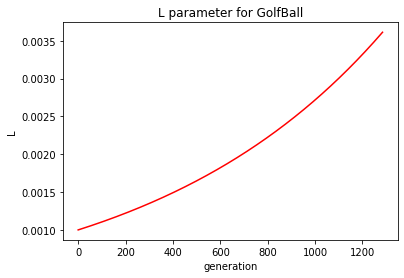

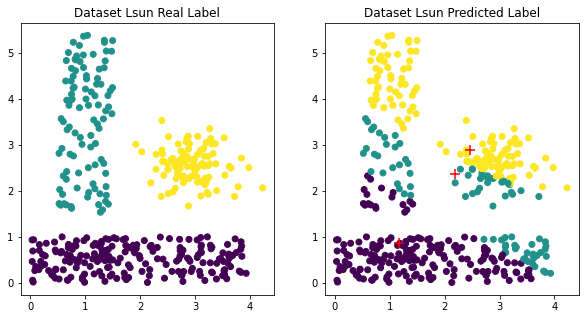

dataset Lsun --- execution time: 25.4030339717865 seconds --- 
dataset Lsun --- rand index score: 0.7520175438596491 seconds --- 
final cost function J= 460.07509222363836


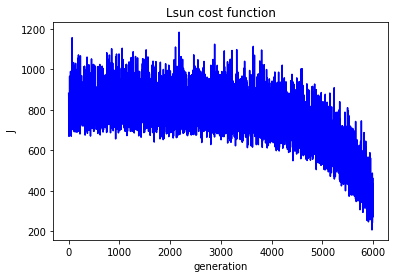

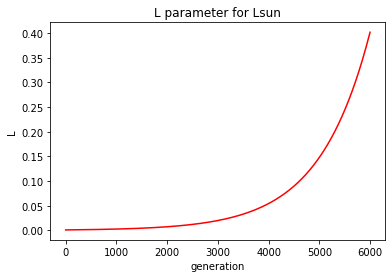

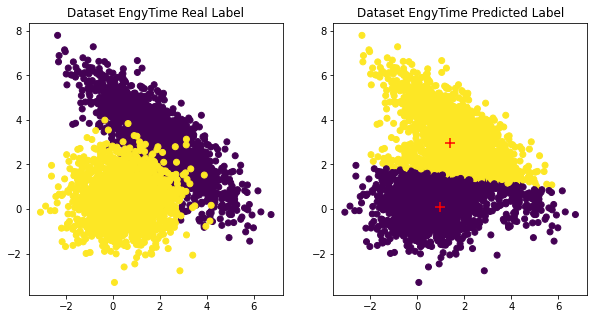

dataset EngyTime --- execution time: 63.62747263908386 seconds --- 
dataset EngyTime --- rand index score: 0.7994315905448718 seconds --- 
final cost function J= 8332.300145536972


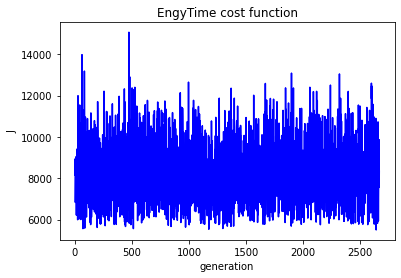

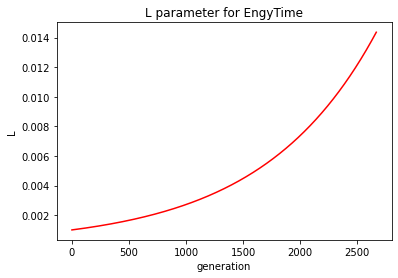

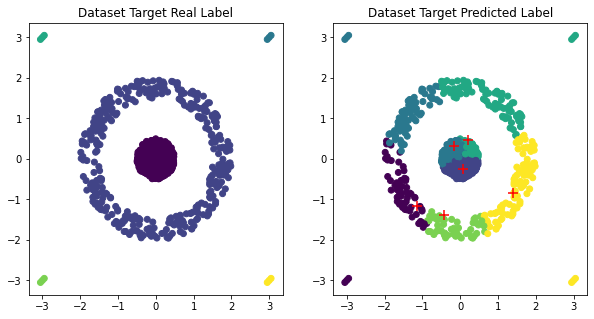

dataset Target --- execution time: 74.12752532958984 seconds --- 
dataset Target --- rand index score: 0.6180771114451219 seconds --- 
final cost function J= -10.105586012256481


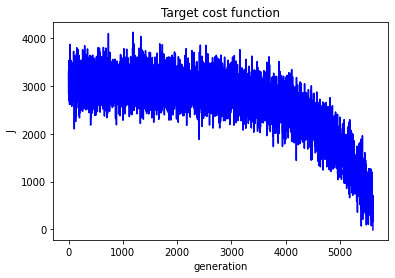

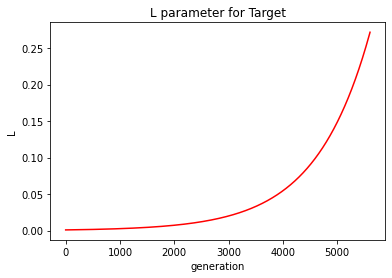

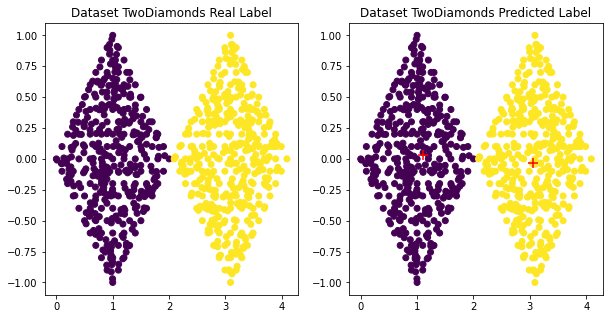

dataset TwoDiamonds --- execution time: 13.318441390991211 seconds --- 
dataset TwoDiamonds --- rand index score: 1.0 seconds --- 
final cost function J= 652.2679886005338


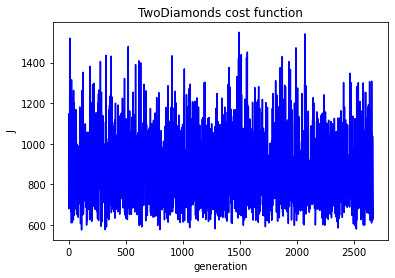

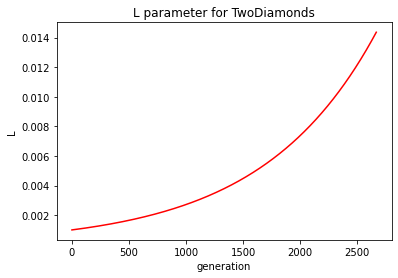

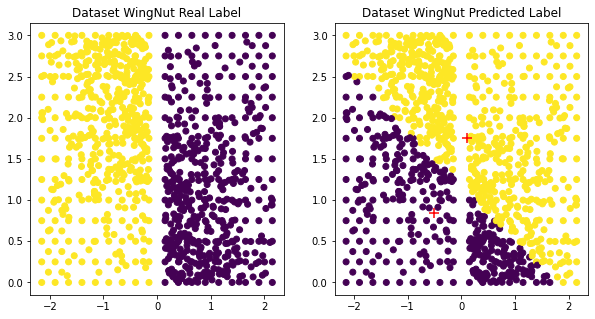

dataset WingNut --- execution time: 16.12389874458313 seconds --- 
dataset WingNut --- rand index score: 0.5060315736395019 seconds --- 
final cost function J= 1152.9961554146291


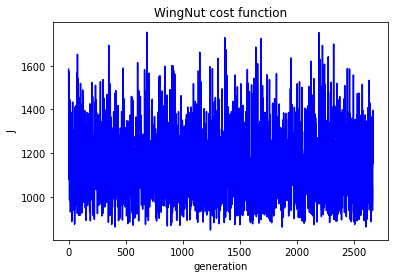

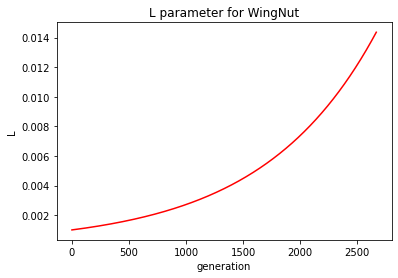

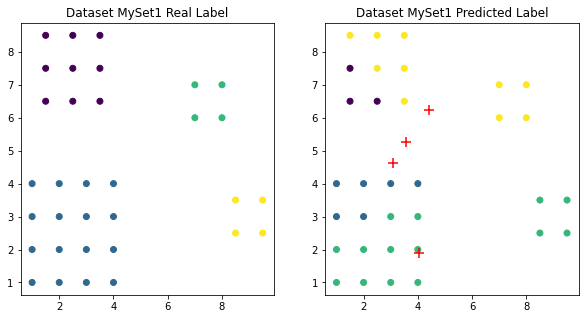

dataset MySet1 --- execution time: 9.938037872314453 seconds --- 
dataset MySet1 --- rand index score: 0.7310606060606061 seconds --- 
final cost function J= -3.052732564438486


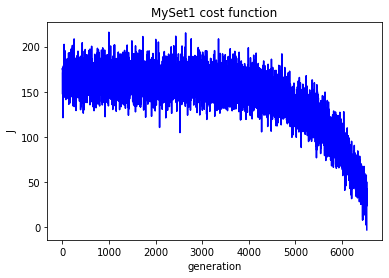

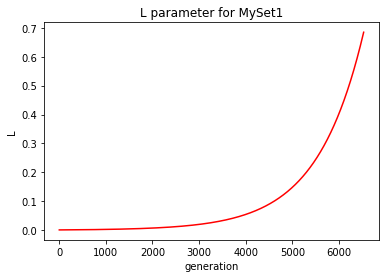

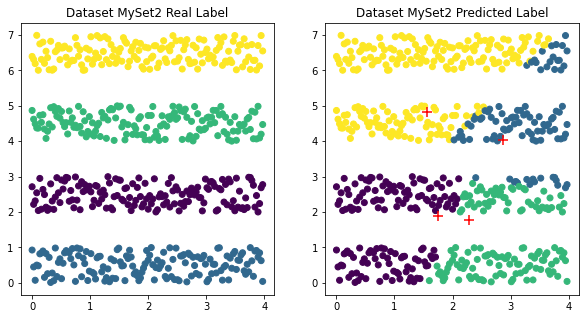

dataset MySet2 --- execution time: 45.62405014038086 seconds --- 
dataset MySet2 --- rand index score: 0.7585809682804674 seconds --- 
final cost function J= -14.500841679093355


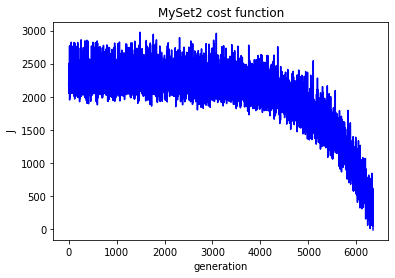

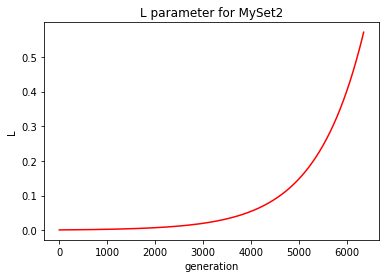

5


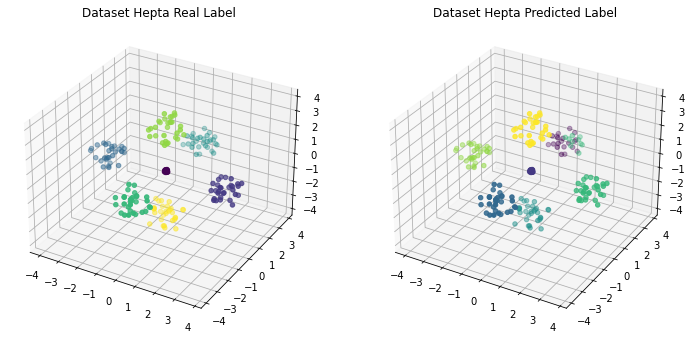

dataset Hepta --- execution time: 31.930973768234253 seconds --- 
dataset Hepta --- rand index score: 0.9776446391844764 seconds --- 
final cost function J= -59.39505236192235


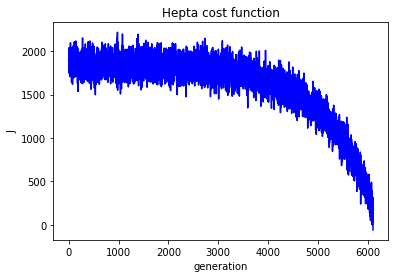

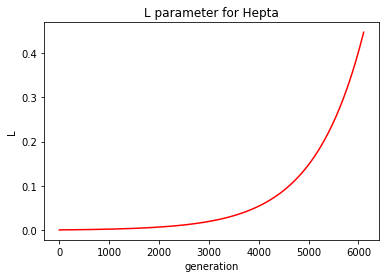

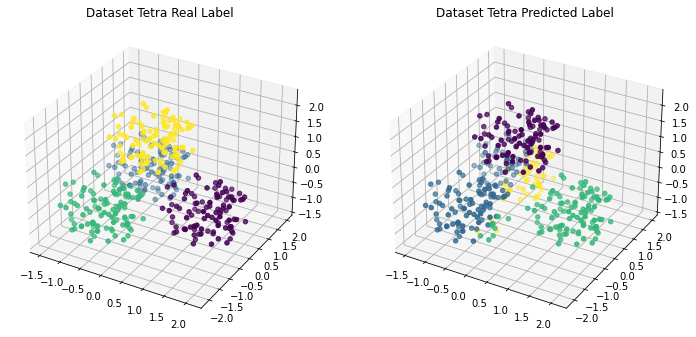

dataset Tetra --- execution time: 31.078892469406128 seconds --- 
dataset Tetra --- rand index score: 0.8729448621553885 seconds --- 
final cost function J= -22.288036006140942


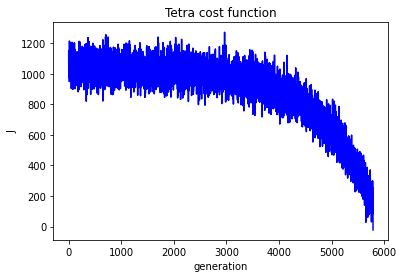

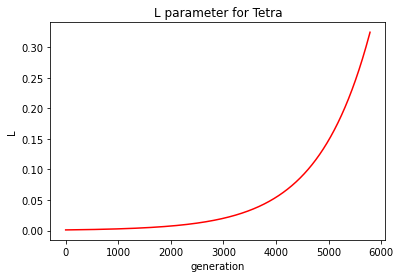

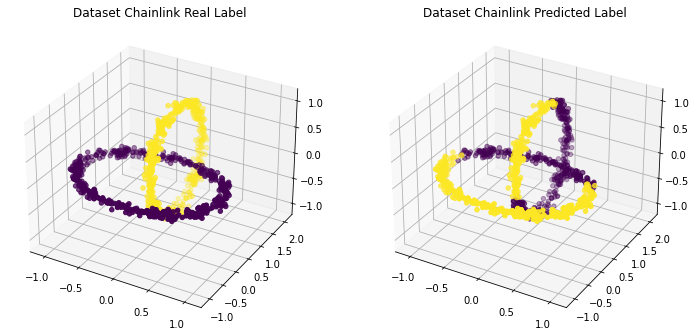

dataset Chainlink --- execution time: 34.88867378234863 seconds --- 
dataset Chainlink --- rand index score: 0.5421741741741741 seconds --- 
final cost function J= 684.4732849119813


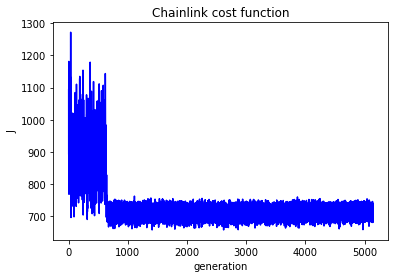

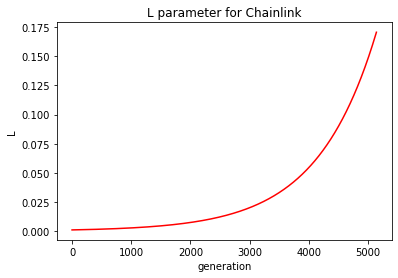

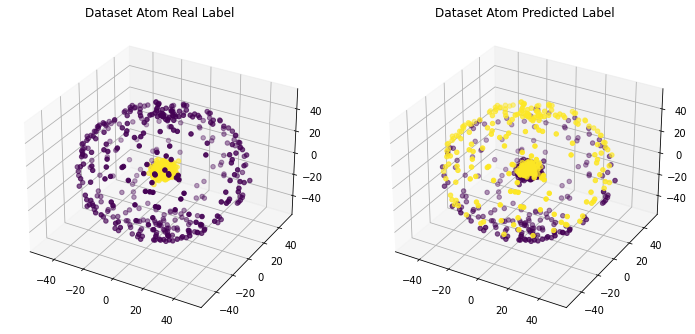

dataset Atom --- execution time: 29.42427635192871 seconds --- 
dataset Atom --- rand index score: 0.5138423028785982 seconds --- 
final cost function J= 14330.409845869443


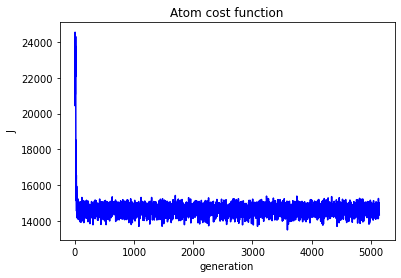

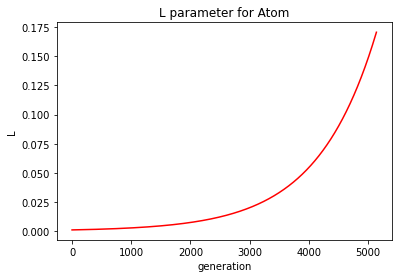

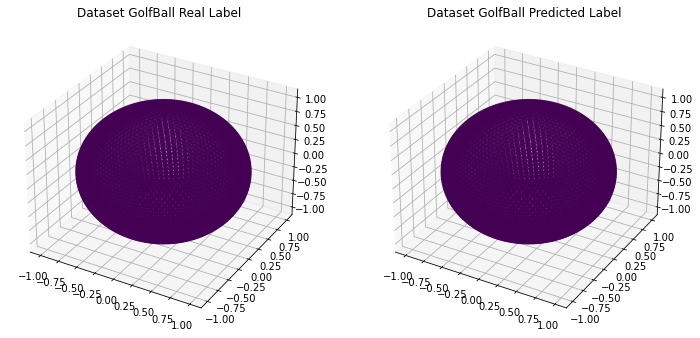

dataset GolfBall --- execution time: 18.73715829849243 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1326.0399012146158


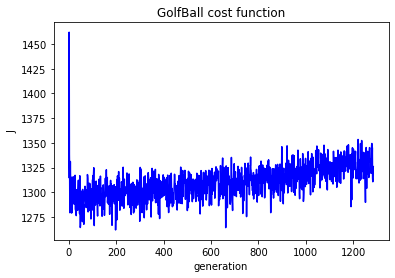

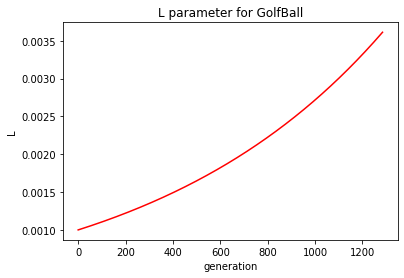

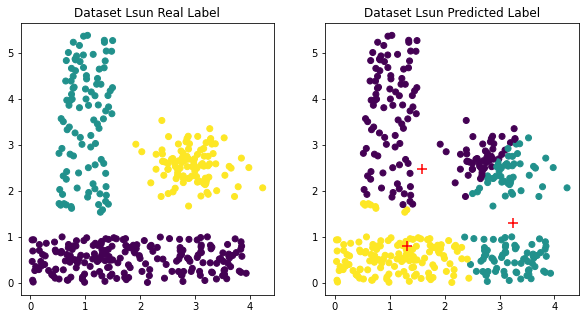

dataset Lsun --- execution time: 24.48249650001526 seconds --- 
dataset Lsun --- rand index score: 0.7308771929824561 seconds --- 
final cost function J= 372.673814724091


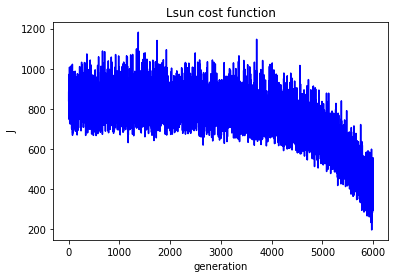

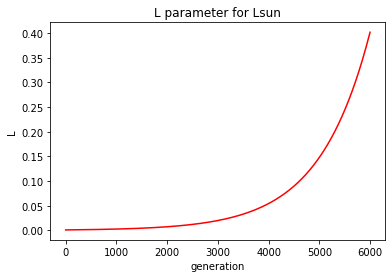

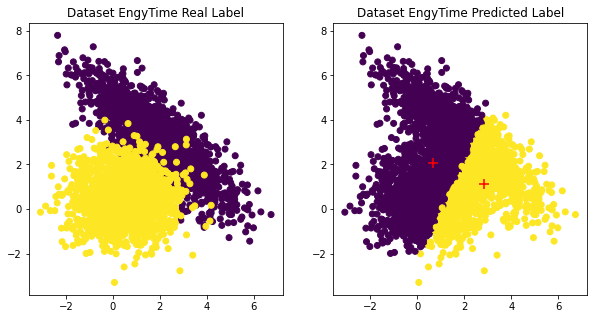

dataset EngyTime --- execution time: 63.3225793838501 seconds --- 
dataset EngyTime --- rand index score: 0.5143181471306472 seconds --- 
final cost function J= 7753.696705424611


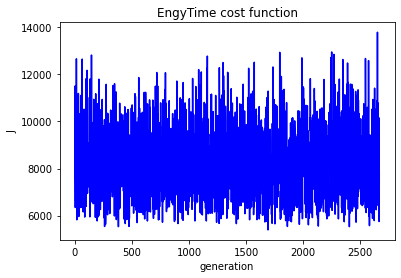

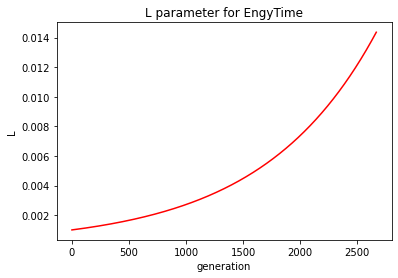

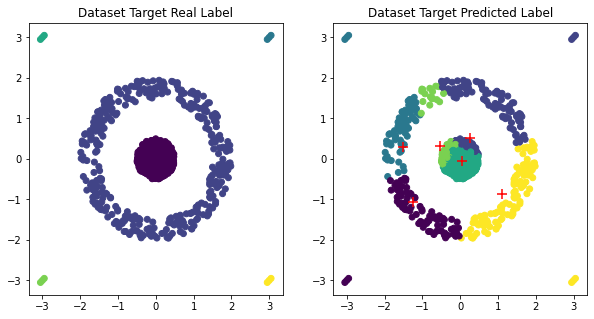

dataset Target --- execution time: 74.3898184299469 seconds --- 
dataset Target --- rand index score: 0.6882204921216625 seconds --- 
final cost function J= -78.09648824804208


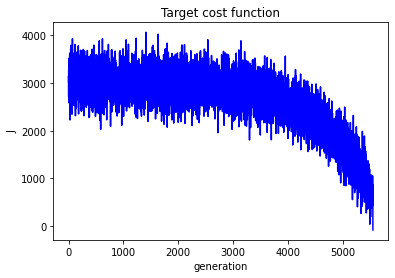

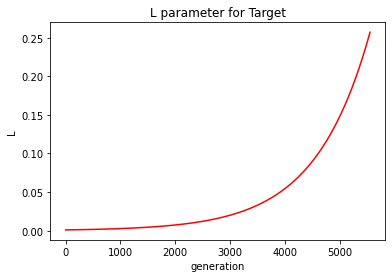

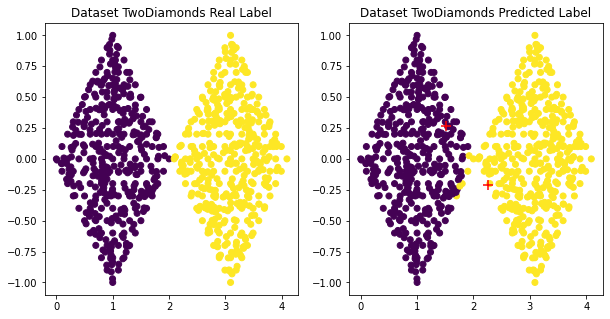

dataset TwoDiamonds --- execution time: 13.731270551681519 seconds --- 
dataset TwoDiamonds --- rand index score: 0.9850938673341677 seconds --- 
final cost function J= 685.622877100566


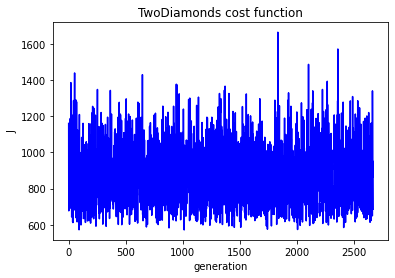

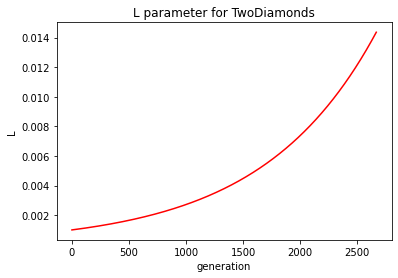

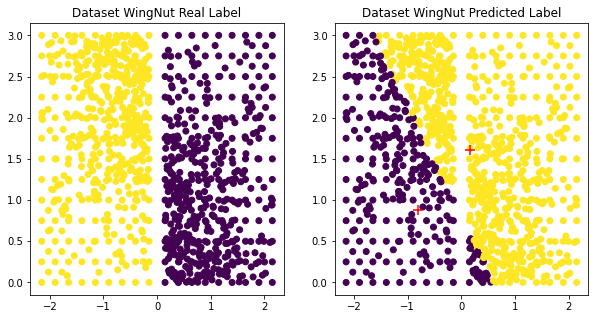

dataset WingNut --- execution time: 15.53248143196106 seconds --- 
dataset WingNut --- rand index score: 0.6021023234164695 seconds --- 
final cost function J= 1467.55526172343


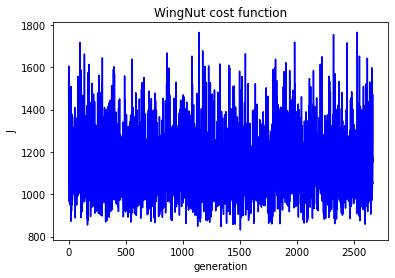

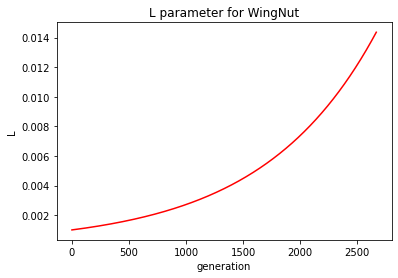

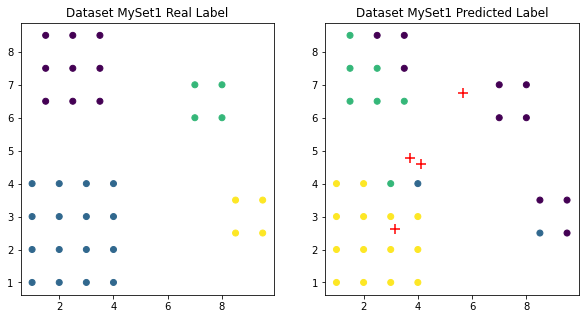

dataset MySet1 --- execution time: 11.460340738296509 seconds --- 
dataset MySet1 --- rand index score: 0.8295454545454546 seconds --- 
final cost function J= -3.425053187354706


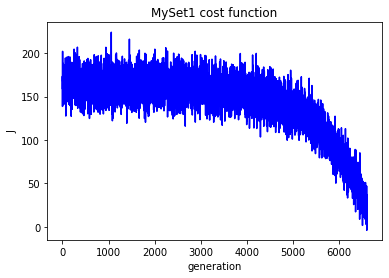

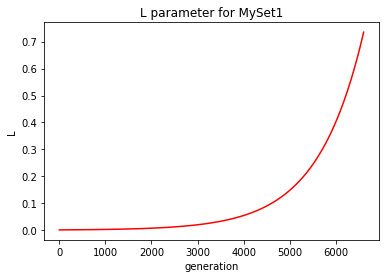

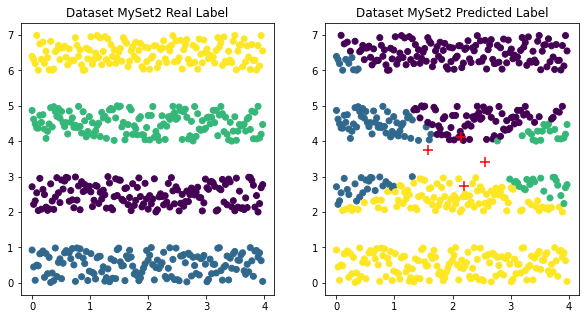

dataset MySet2 --- execution time: 46.251615047454834 seconds --- 
dataset MySet2 --- rand index score: 0.7653589315525876 seconds --- 
final cost function J= -50.28376096383977


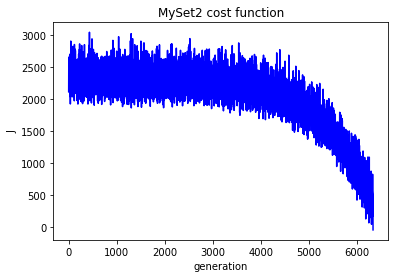

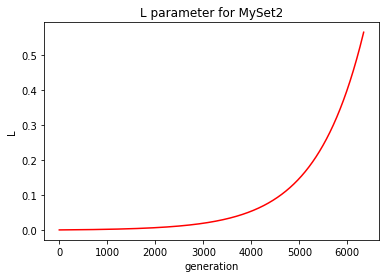

6


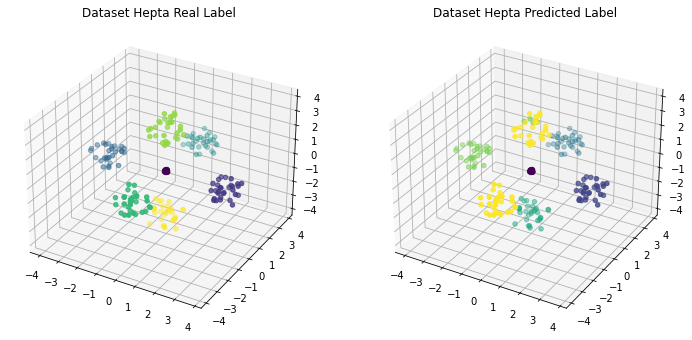

dataset Hepta --- execution time: 30.675544500350952 seconds --- 
dataset Hepta --- rand index score: 0.9551104354824287 seconds --- 
final cost function J= -44.23990757661545


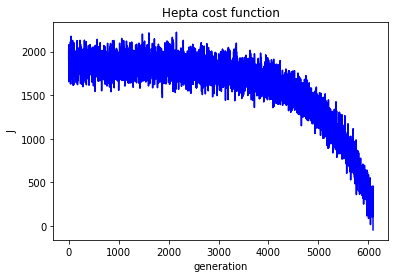

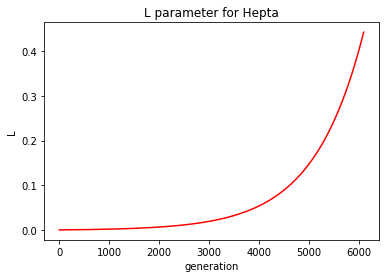

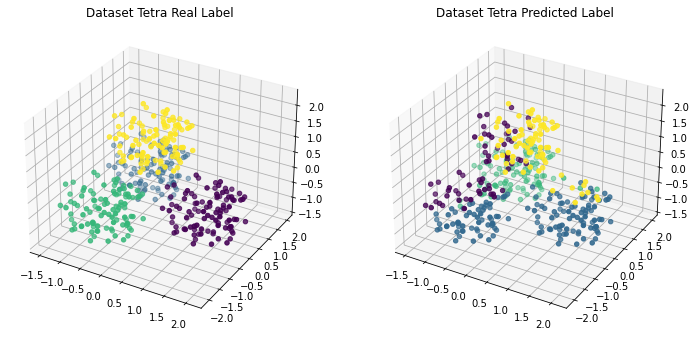

dataset Tetra --- execution time: 32.46911597251892 seconds --- 
dataset Tetra --- rand index score: 0.820062656641604 seconds --- 
final cost function J= -43.77200143021457


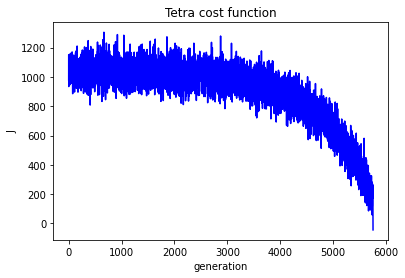

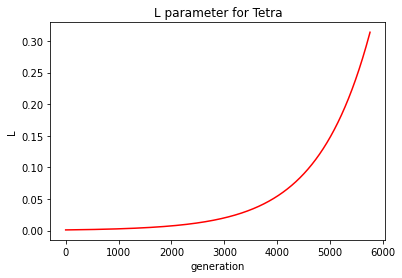

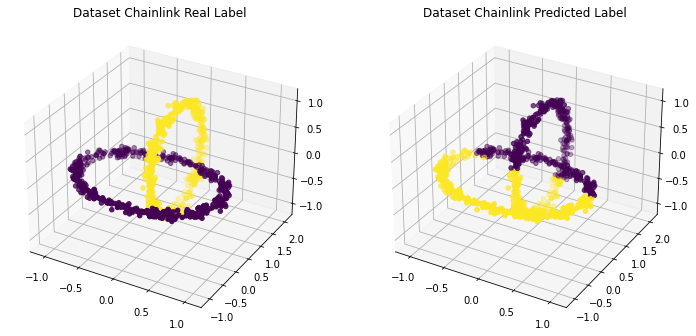

dataset Chainlink --- execution time: 33.75389051437378 seconds --- 
dataset Chainlink --- rand index score: 0.5237237237237238 seconds --- 
final cost function J= 712.763288774404


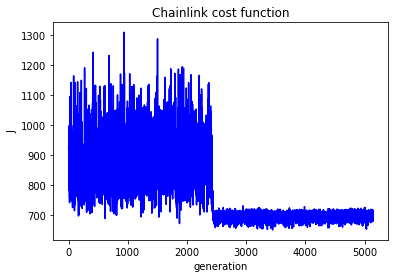

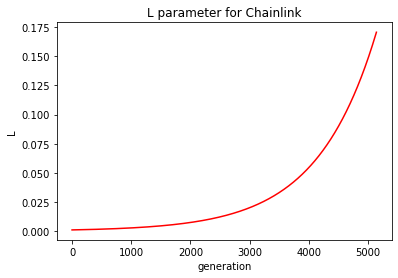

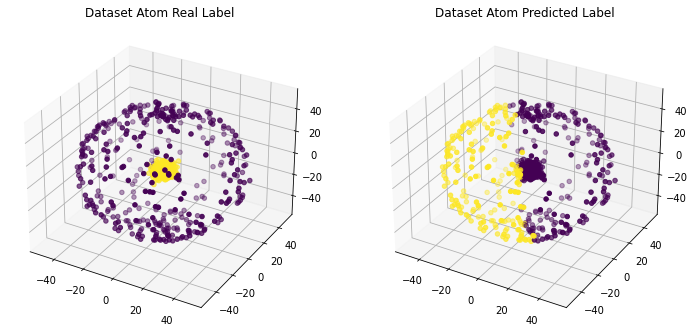

dataset Atom --- execution time: 28.07345724105835 seconds --- 
dataset Atom --- rand index score: 0.5794743429286608 seconds --- 
final cost function J= 15694.100411883923


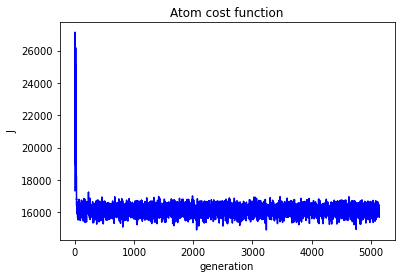

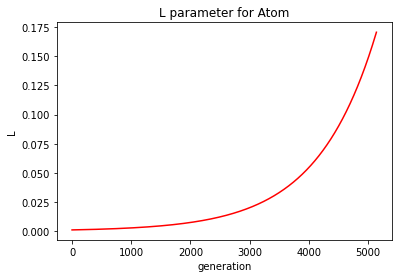

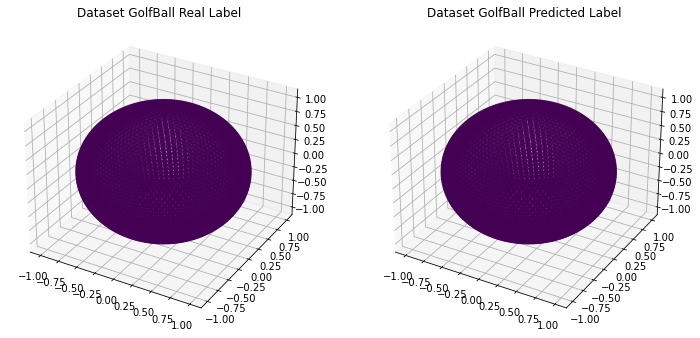

dataset GolfBall --- execution time: 18.78072953224182 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1309.5485018044023


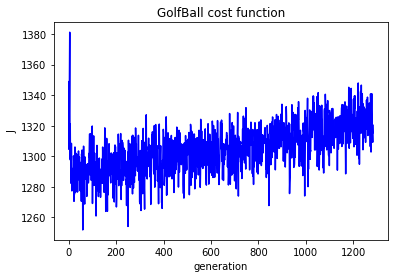

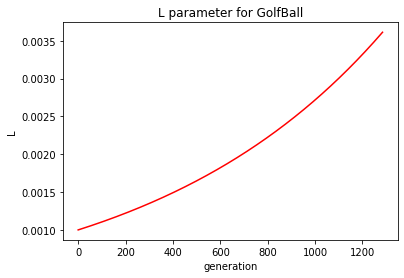

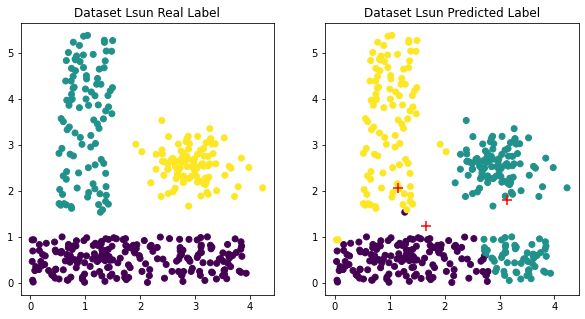

dataset Lsun --- execution time: 23.65969729423523 seconds --- 
dataset Lsun --- rand index score: 0.8138471177944863 seconds --- 
final cost function J= 275.4527802113232


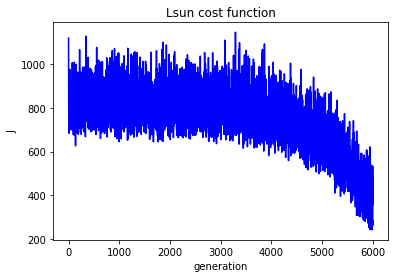

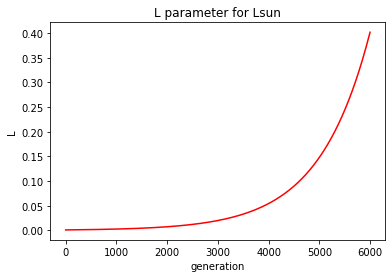

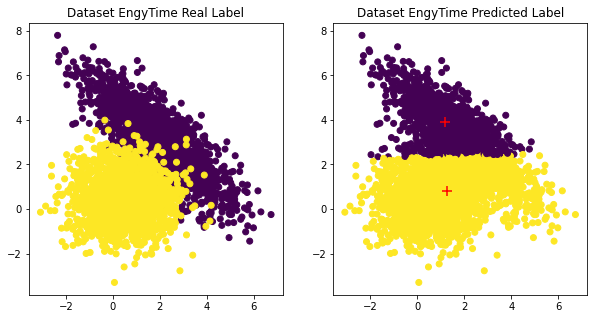

dataset EngyTime --- execution time: 62.12085938453674 seconds --- 
dataset EngyTime --- rand index score: 0.6998436784569597 seconds --- 
final cost function J= 9031.390802716283


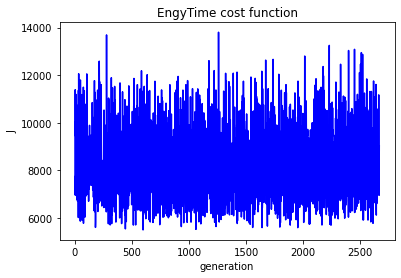

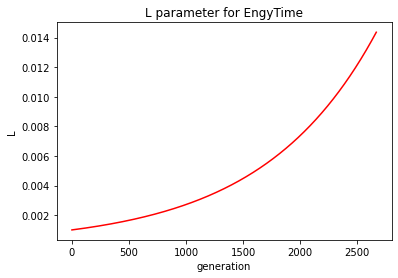

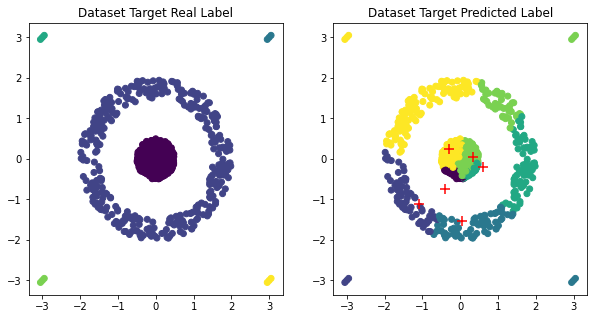

dataset Target --- execution time: 72.34697365760803 seconds --- 
dataset Target --- rand index score: 0.5550470335905967 seconds --- 
final cost function J= -2.372636270597013


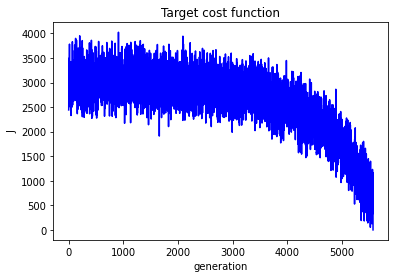

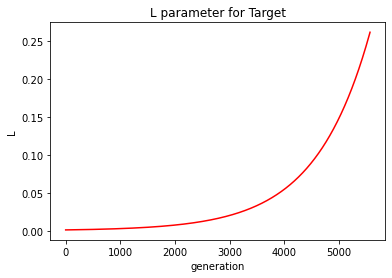

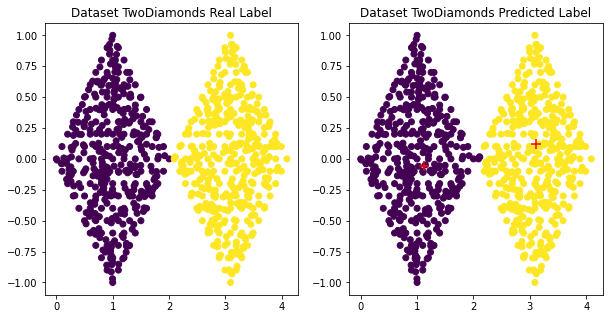

dataset TwoDiamonds --- execution time: 13.799164295196533 seconds --- 
dataset TwoDiamonds --- rand index score: 0.9925187734668336 seconds --- 
final cost function J= 718.5729537703064


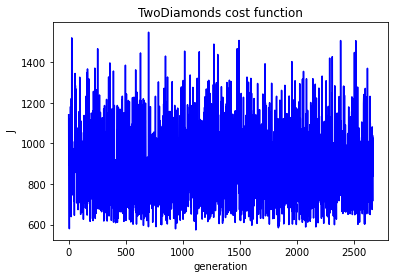

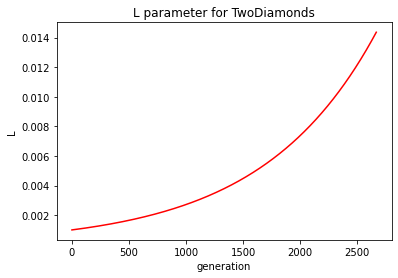

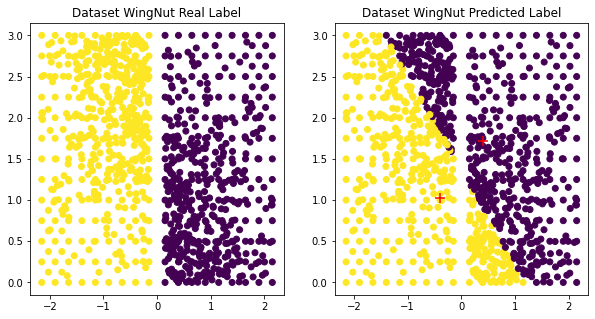

dataset WingNut --- execution time: 15.474583387374878 seconds --- 
dataset WingNut --- rand index score: 0.5850354912532485 seconds --- 
final cost function J= 1394.1252273574637


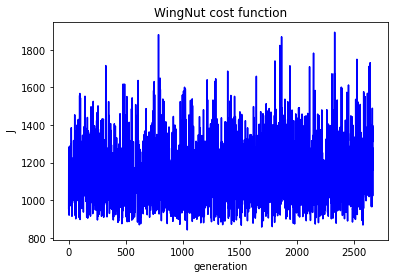

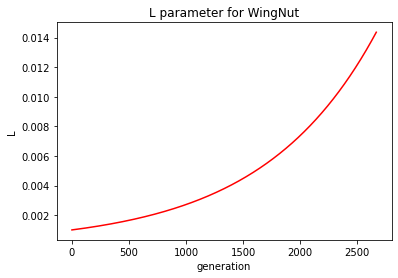

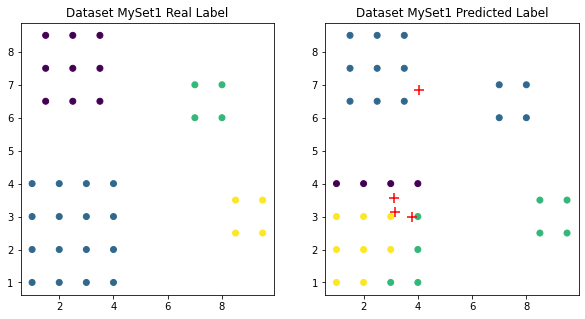

dataset MySet1 --- execution time: 9.832693099975586 seconds --- 
dataset MySet1 --- rand index score: 0.75 seconds --- 
final cost function J= -4.07682405564762


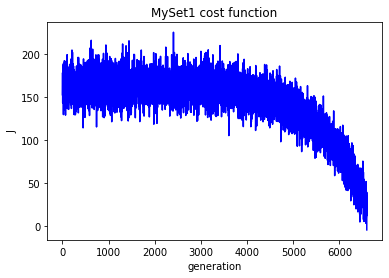

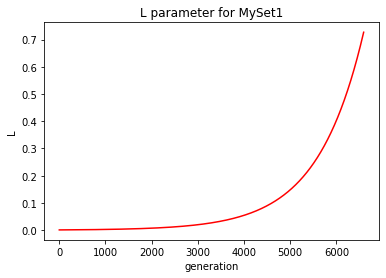

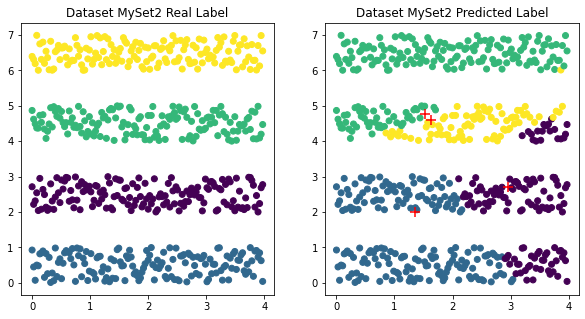

dataset MySet2 --- execution time: 45.99895715713501 seconds --- 
dataset MySet2 --- rand index score: 0.7873344462993879 seconds --- 
final cost function J= -0.03282700489808121


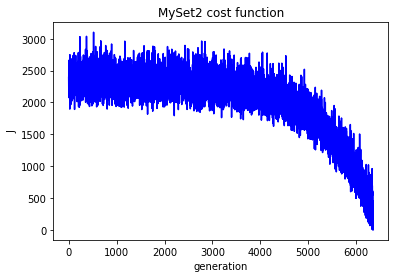

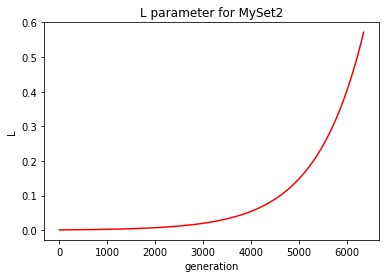

7


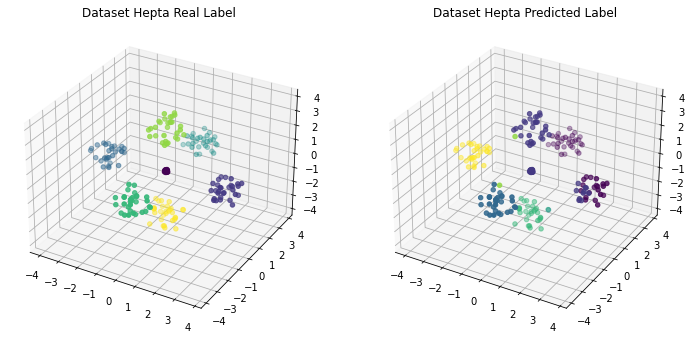

dataset Hepta --- execution time: 31.298264265060425 seconds --- 
dataset Hepta --- rand index score: 0.8915317893230796 seconds --- 
final cost function J= -12.32330446474134


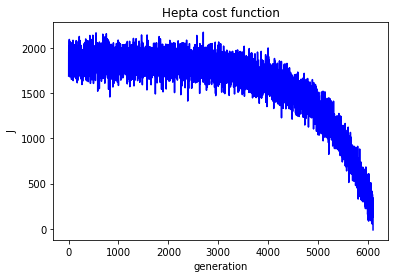

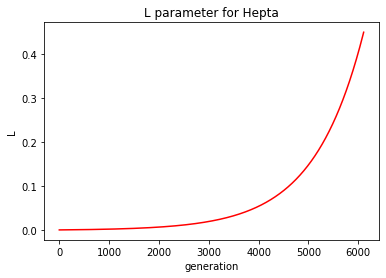

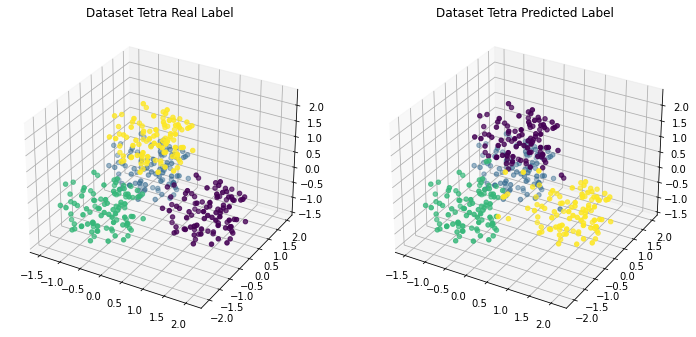

dataset Tetra --- execution time: 32.42428779602051 seconds --- 
dataset Tetra --- rand index score: 0.9659774436090226 seconds --- 
final cost function J= -0.27601902158983194


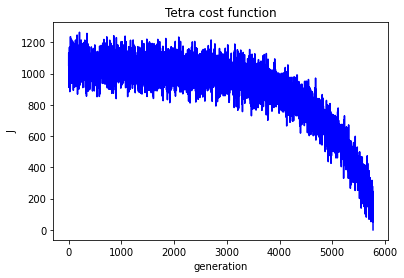

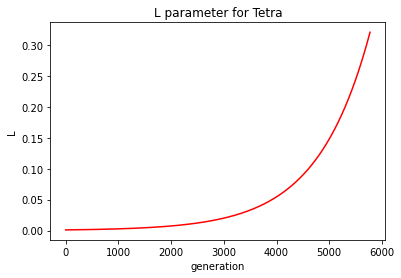

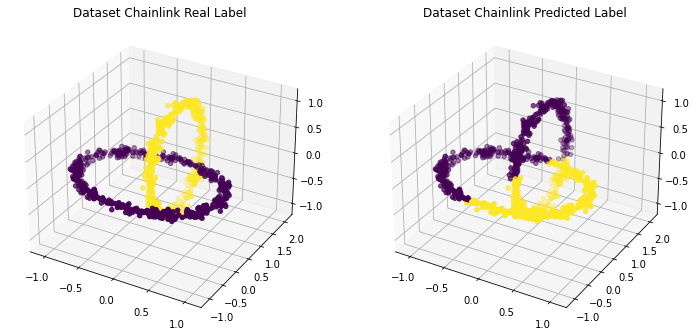

dataset Chainlink --- execution time: 33.247116804122925 seconds --- 
dataset Chainlink --- rand index score: 0.5009589589589589 seconds --- 
final cost function J= 717.9726235615614


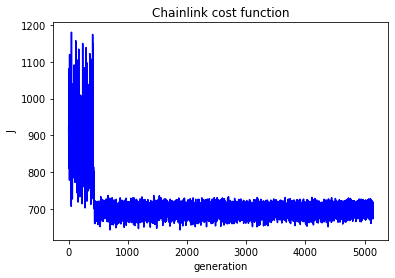

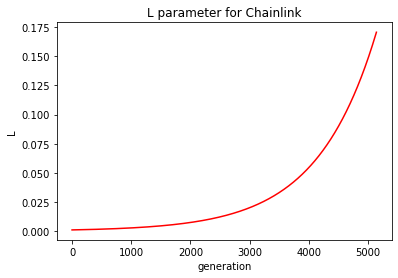

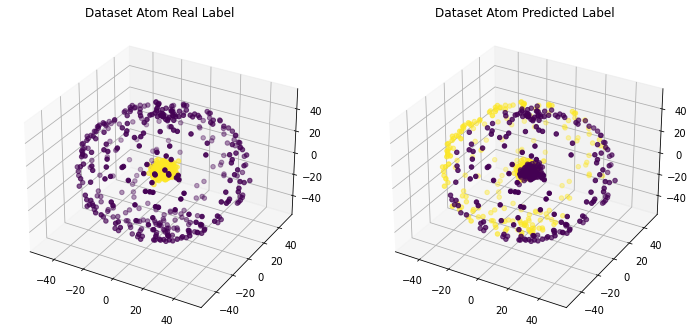

dataset Atom --- execution time: 28.13572382926941 seconds --- 
dataset Atom --- rand index score: 0.5084981226533166 seconds --- 
final cost function J= 15190.688392023078


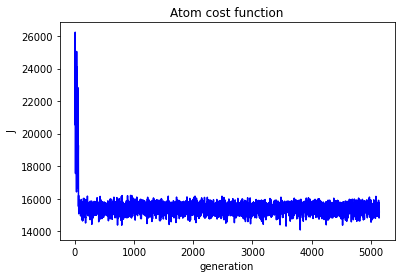

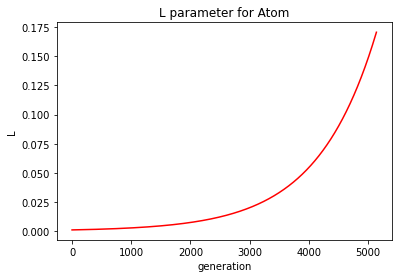

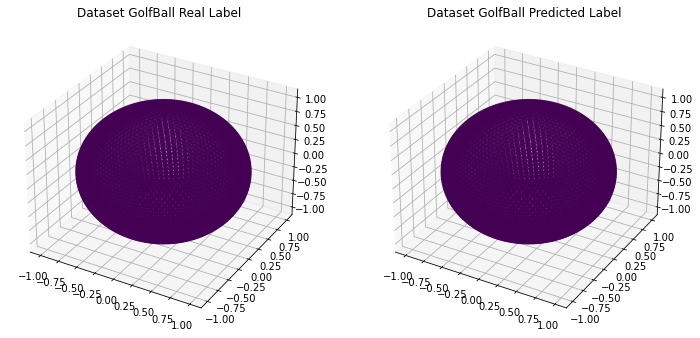

dataset GolfBall --- execution time: 18.18055772781372 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1331.1558070437643


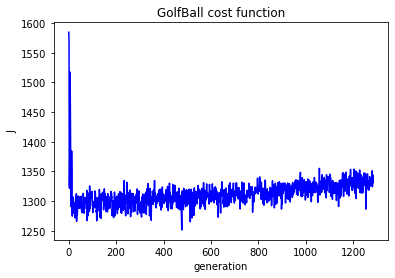

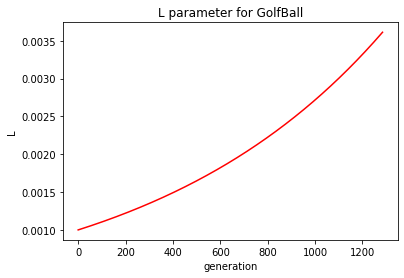

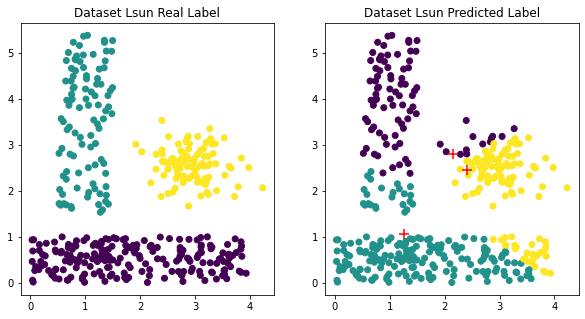

dataset Lsun --- execution time: 24.024728298187256 seconds --- 
dataset Lsun --- rand index score: 0.8054010025062657 seconds --- 
final cost function J= 472.7025681818711


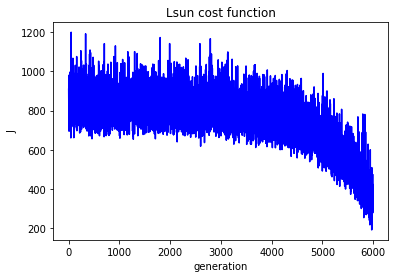

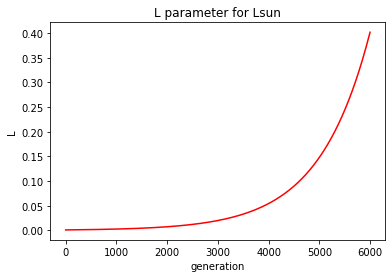

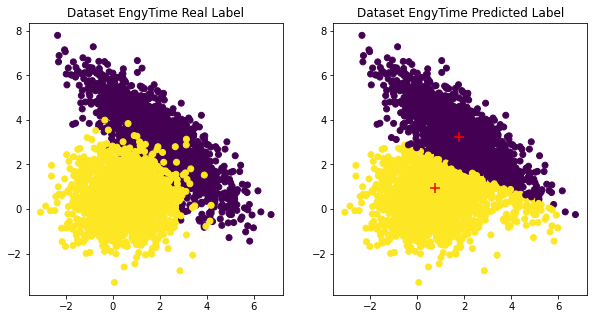

dataset EngyTime --- execution time: 63.92714858055115 seconds --- 
dataset EngyTime --- rand index score: 0.8692307692307693 seconds --- 
final cost function J= 10787.578652609196


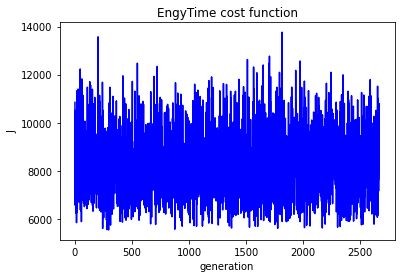

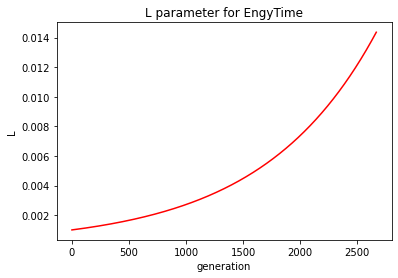

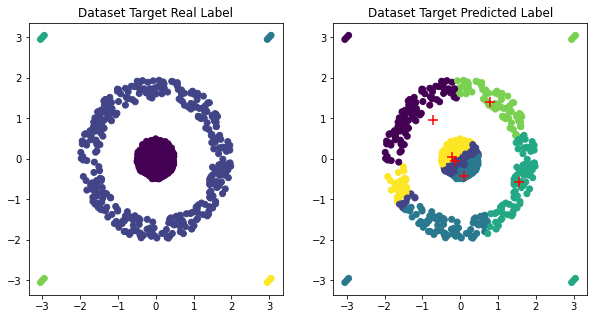

dataset Target --- execution time: 76.72281074523926 seconds --- 
dataset Target --- rand index score: 0.6014321179470724 seconds --- 
final cost function J= -44.63858166172304


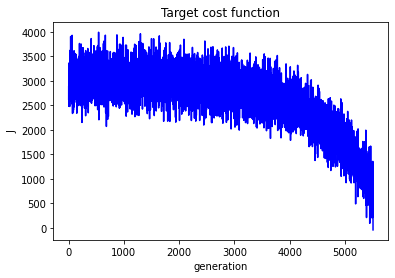

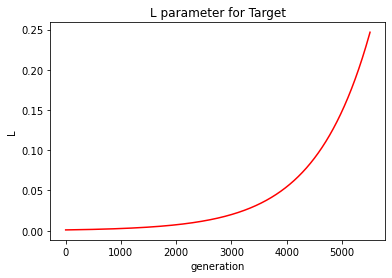

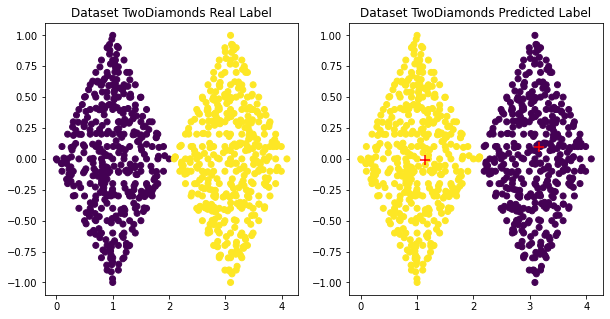

dataset TwoDiamonds --- execution time: 13.425119638442993 seconds --- 
dataset TwoDiamonds --- rand index score: 0.9925187734668336 seconds --- 
final cost function J= 716.9093935405732


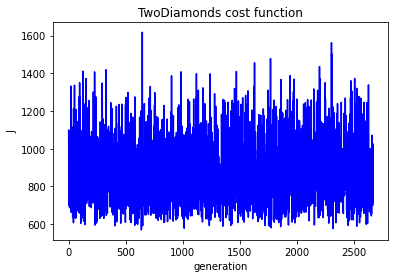

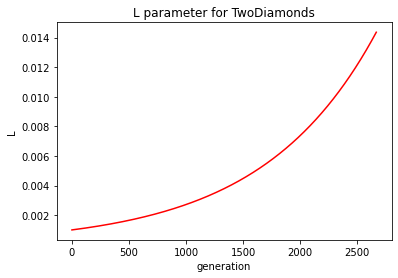

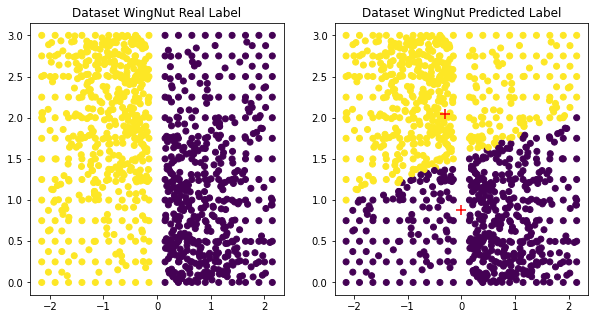

dataset WingNut --- execution time: 16.030667304992676 seconds --- 
dataset WingNut --- rand index score: 0.6336546293782243 seconds --- 
final cost function J= 1476.208777734911


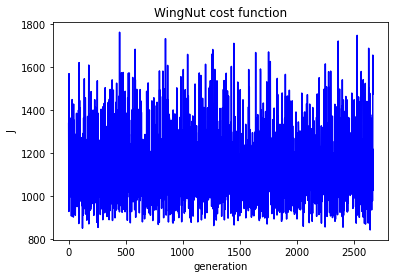

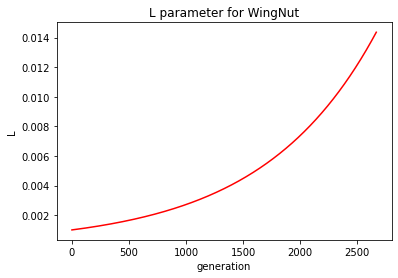

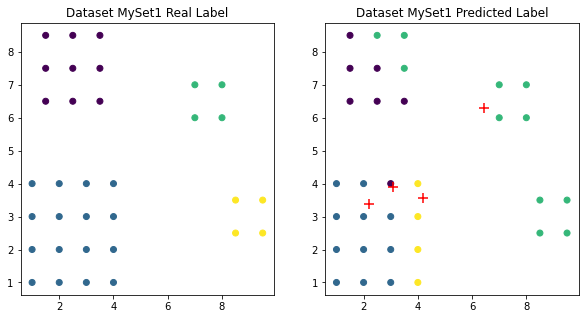

dataset MySet1 --- execution time: 10.81110143661499 seconds --- 
dataset MySet1 --- rand index score: 0.7670454545454546 seconds --- 
final cost function J= -5.401577397996306


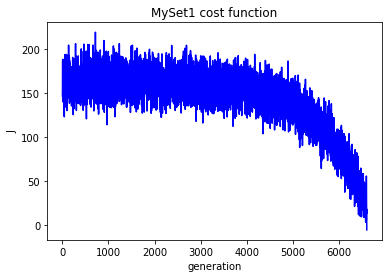

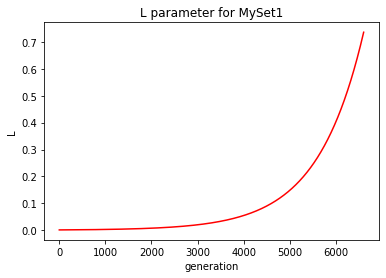

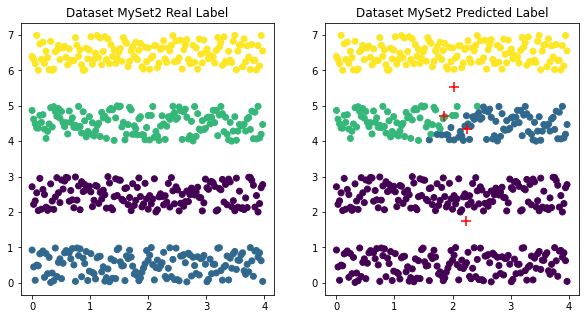

dataset MySet2 --- execution time: 48.107290267944336 seconds --- 
dataset MySet2 --- rand index score: 0.8435392320534224 seconds --- 
final cost function J= -8.291851456807308


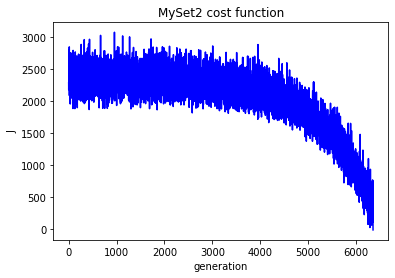

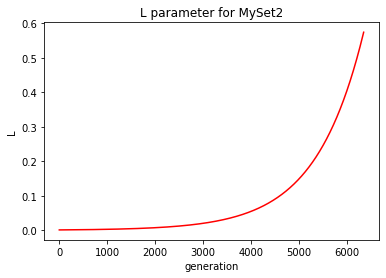

8


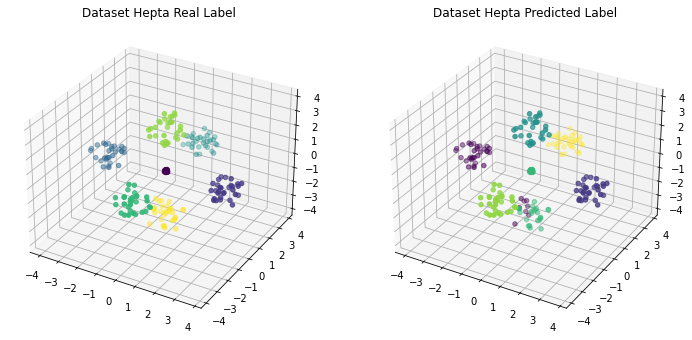

dataset Hepta --- execution time: 33.60097932815552 seconds --- 
dataset Hepta --- rand index score: 0.9499239917732272 seconds --- 
final cost function J= -9.991656469472673


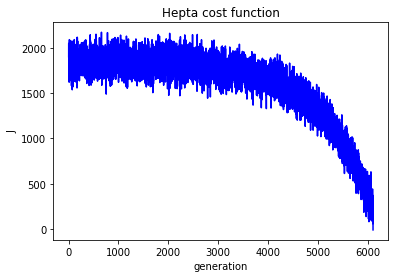

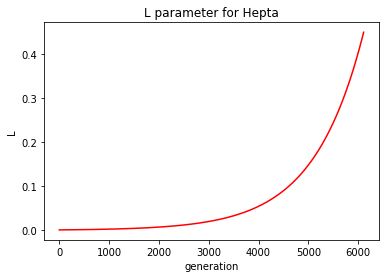

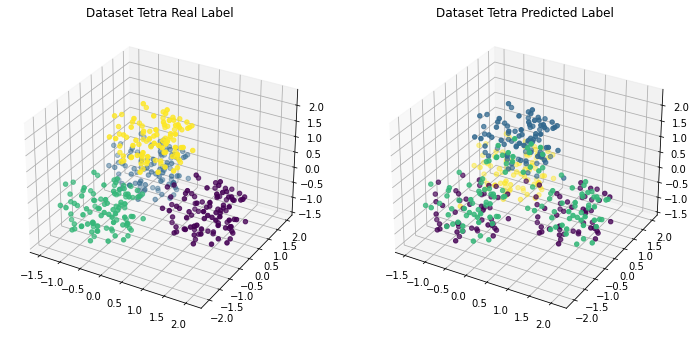

dataset Tetra --- execution time: 33.498430252075195 seconds --- 
dataset Tetra --- rand index score: 0.7948872180451128 seconds --- 
final cost function J= -21.390527095676816


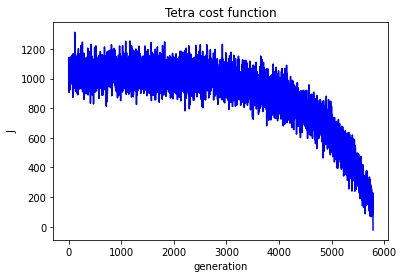

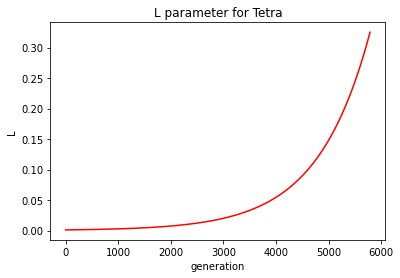

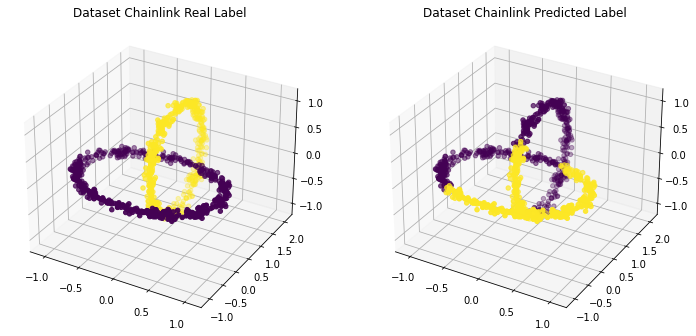

dataset Chainlink --- execution time: 36.67789626121521 seconds --- 
dataset Chainlink --- rand index score: 0.5187267267267267 seconds --- 
final cost function J= 712.563430363318


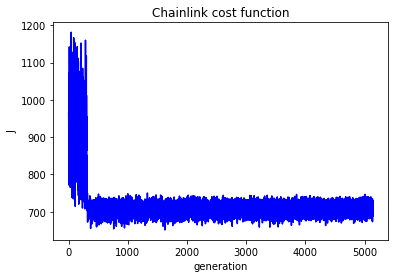

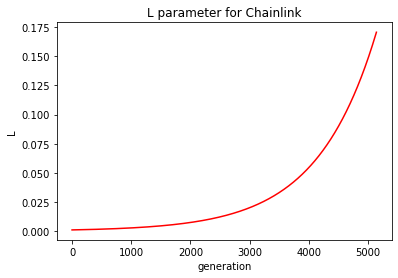

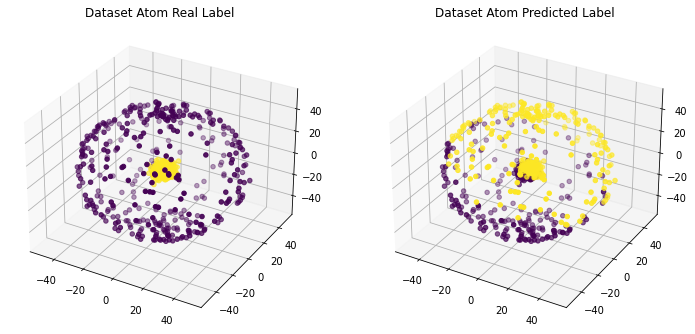

dataset Atom --- execution time: 28.518725395202637 seconds --- 
dataset Atom --- rand index score: 0.5034292866082604 seconds --- 
final cost function J= 14989.030853511747


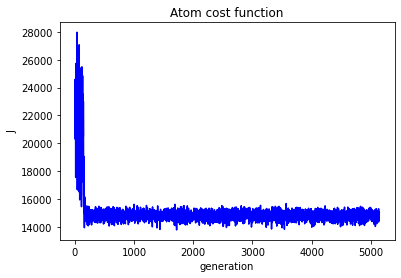

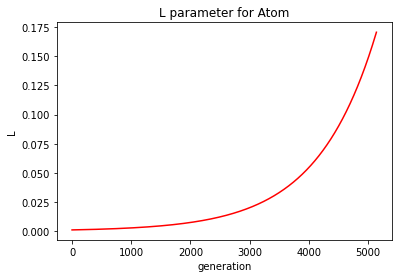

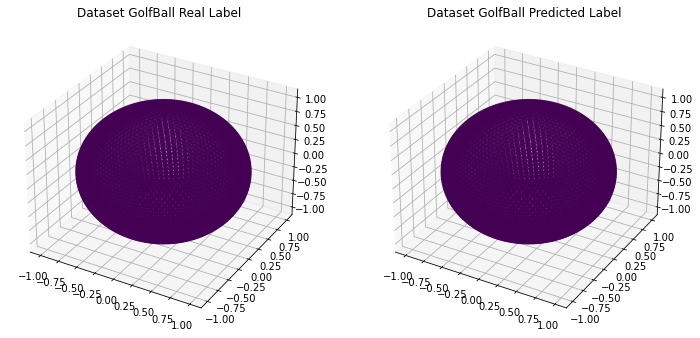

dataset GolfBall --- execution time: 19.48326086997986 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1338.6598386636354


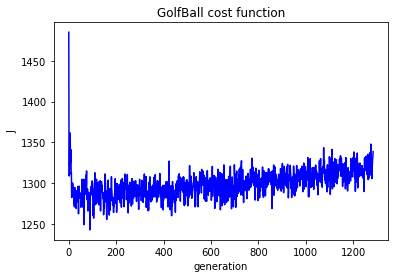

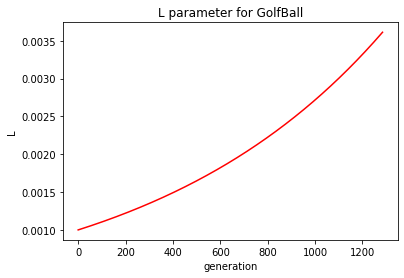

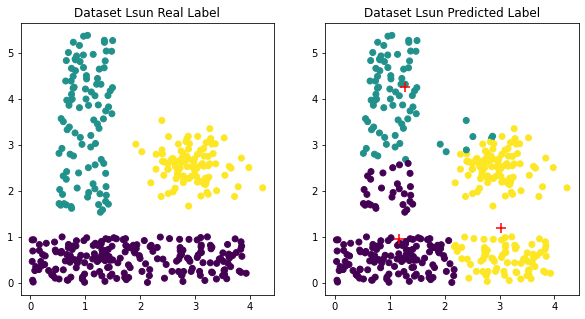

dataset Lsun --- execution time: 26.764004230499268 seconds --- 
dataset Lsun --- rand index score: 0.7066917293233083 seconds --- 
final cost function J= 451.1592252651757


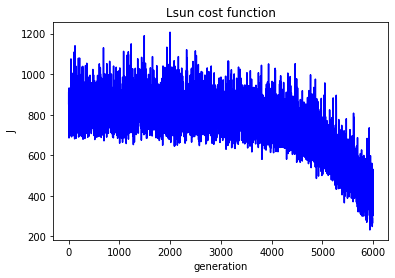

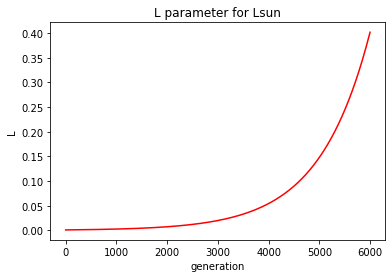

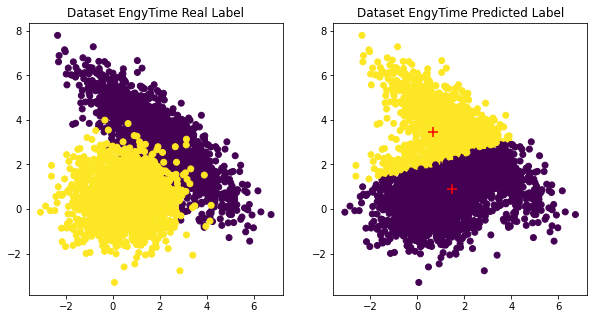

dataset EngyTime --- execution time: 64.03470516204834 seconds --- 
dataset EngyTime --- rand index score: 0.645734603937729 seconds --- 
final cost function J= 7265.886528112082


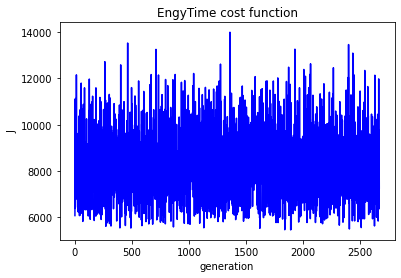

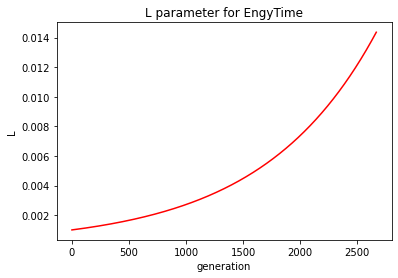

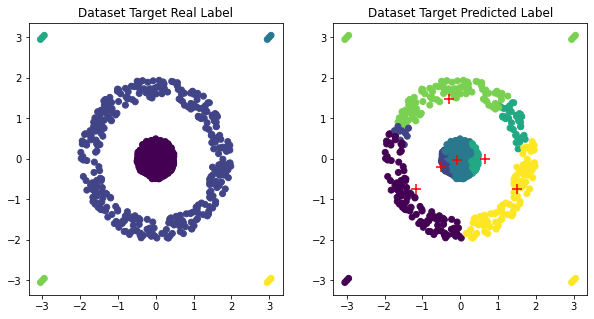

dataset Target --- execution time: 73.64356684684753 seconds --- 
dataset Target --- rand index score: 0.6973029571209025 seconds --- 
final cost function J= -55.97796548858105


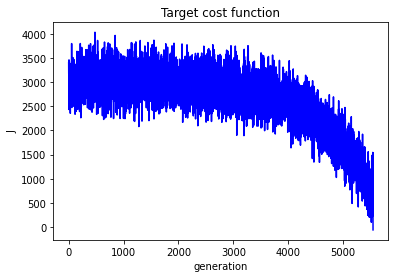

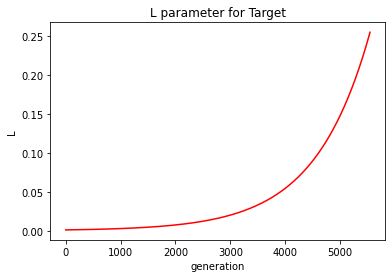

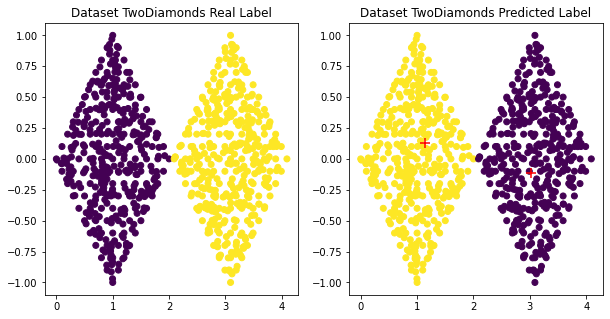

dataset TwoDiamonds --- execution time: 13.666462659835815 seconds --- 
dataset TwoDiamonds --- rand index score: 1.0 seconds --- 
final cost function J= 772.2415807984846


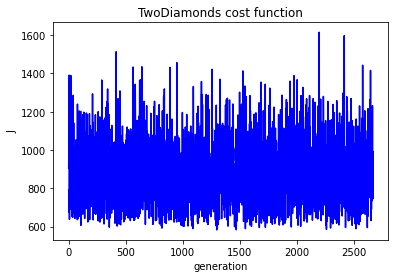

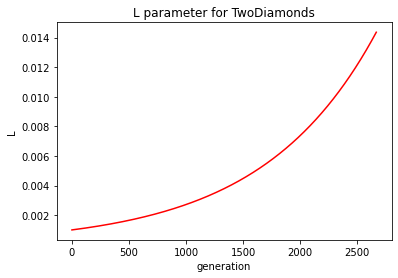

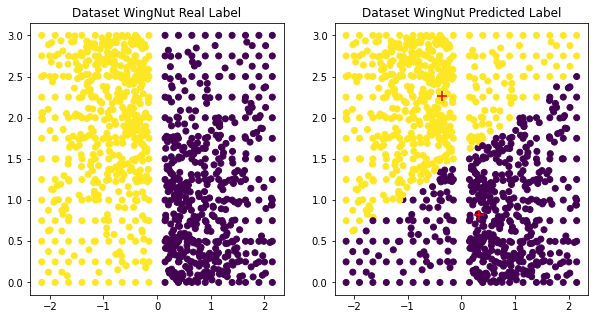

dataset WingNut --- execution time: 15.736106395721436 seconds --- 
dataset WingNut --- rand index score: 0.7132772196578876 seconds --- 
final cost function J= 986.416453423038


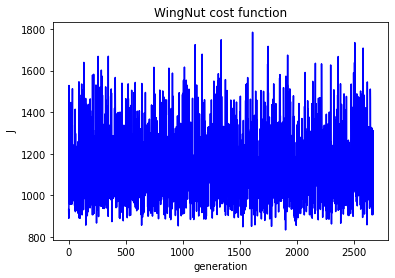

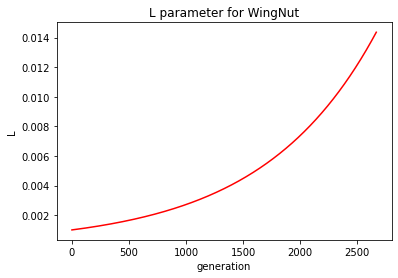

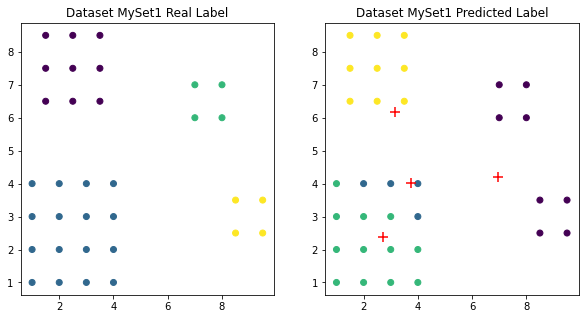

dataset MySet1 --- execution time: 9.903513669967651 seconds --- 
dataset MySet1 --- rand index score: 0.8787878787878788 seconds --- 
final cost function J= -12.717461099964552


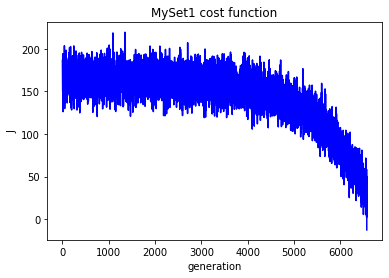

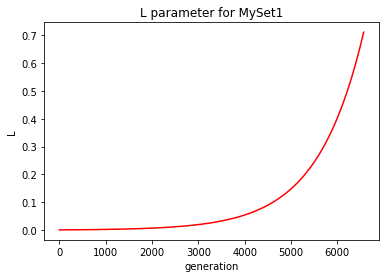

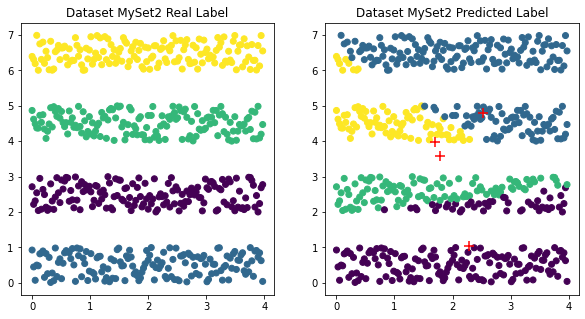

dataset MySet2 --- execution time: 45.00861191749573 seconds --- 
dataset MySet2 --- rand index score: 0.8366666666666667 seconds --- 
final cost function J= -0.4601230768314508


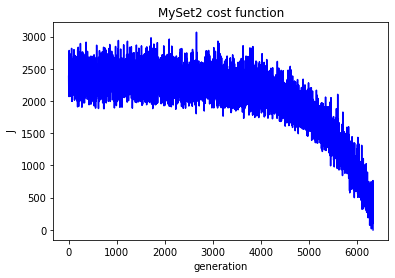

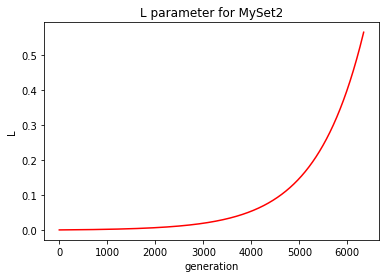

9


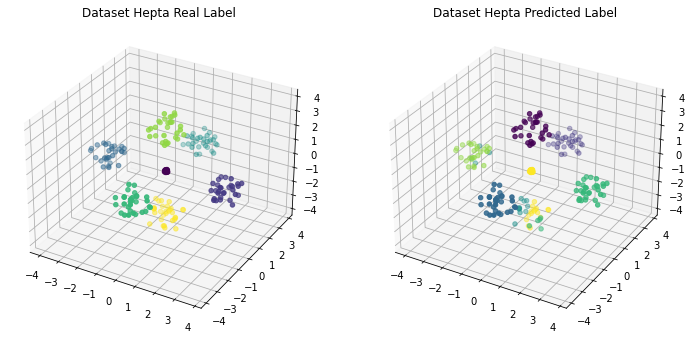

dataset Hepta --- execution time: 31.086878061294556 seconds --- 
dataset Hepta --- rand index score: 0.9530984530090316 seconds --- 
final cost function J= -10.827401344316968


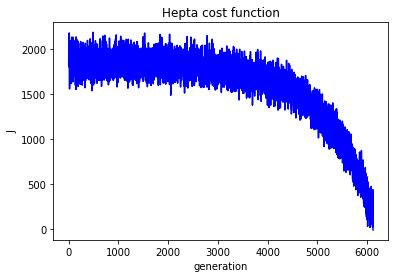

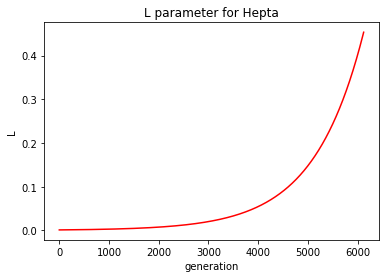

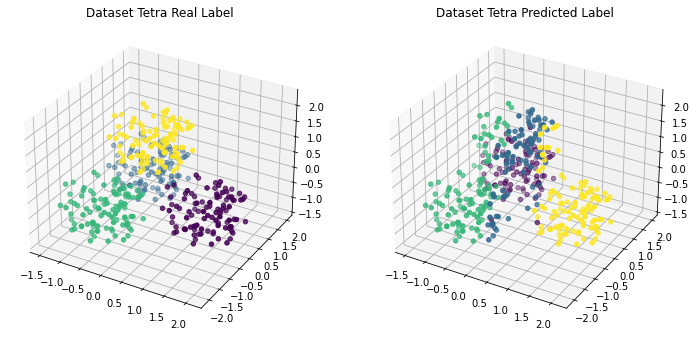

dataset Tetra --- execution time: 32.01636743545532 seconds --- 
dataset Tetra --- rand index score: 0.8622556390977444 seconds --- 
final cost function J= -13.062446730788338


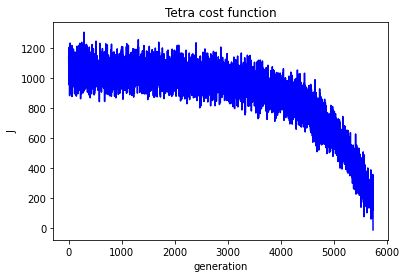

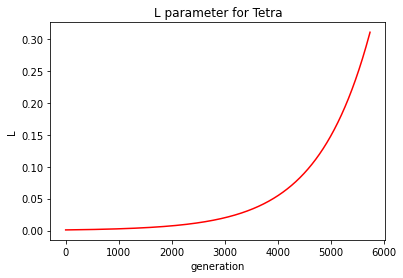

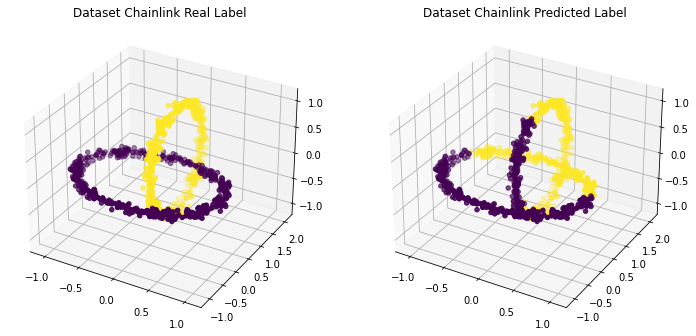

dataset Chainlink --- execution time: 33.63906383514404 seconds --- 
dataset Chainlink --- rand index score: 0.5457537537537538 seconds --- 
final cost function J= 828.2169983195574


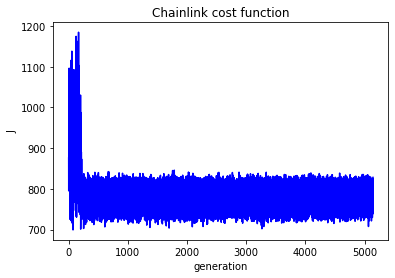

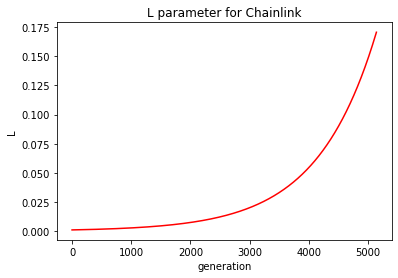

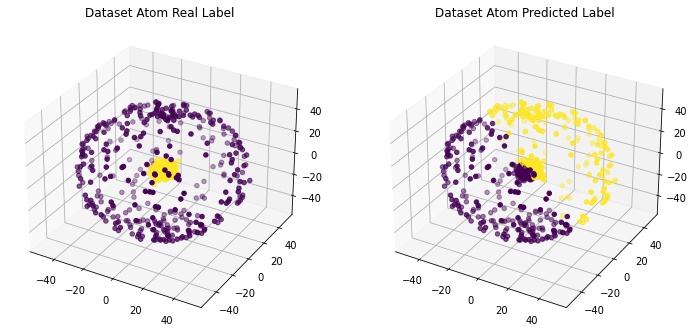

dataset Atom --- execution time: 28.714199781417847 seconds --- 
dataset Atom --- rand index score: 0.5078347934918648 seconds --- 
final cost function J= 15246.77435213774


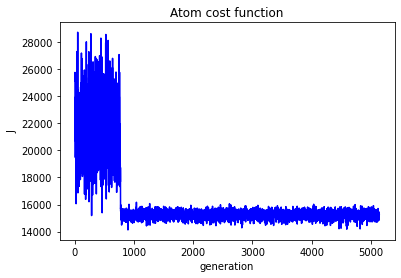

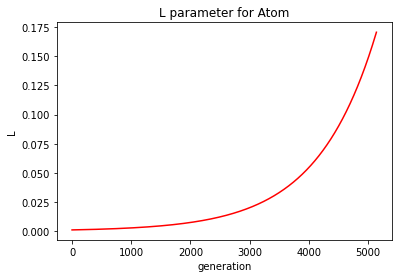

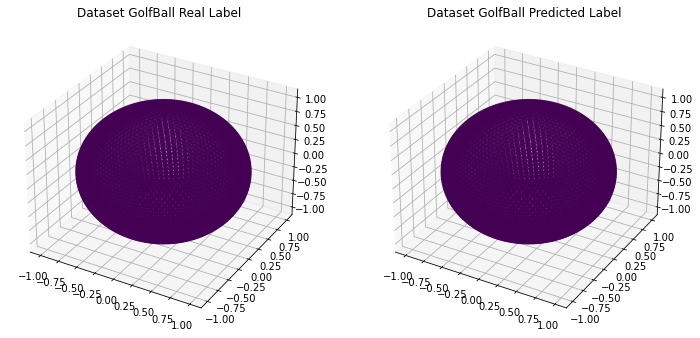

dataset GolfBall --- execution time: 18.36928701400757 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1333.688566961657


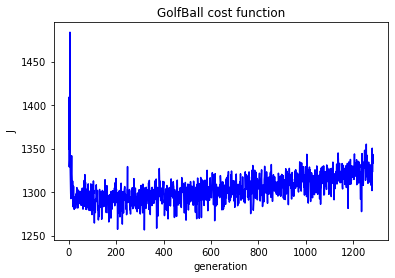

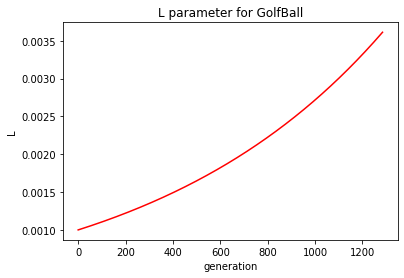

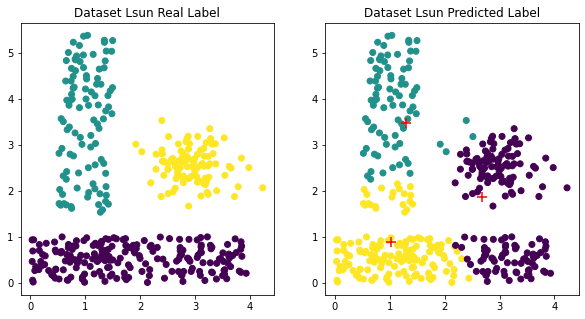

dataset Lsun --- execution time: 24.60220241546631 seconds --- 
dataset Lsun --- rand index score: 0.7330200501253132 seconds --- 
final cost function J= 361.1848359012288


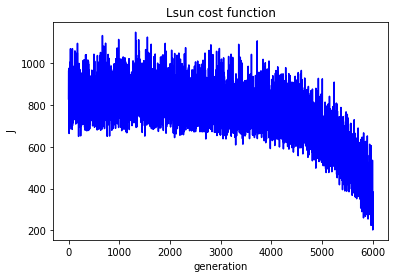

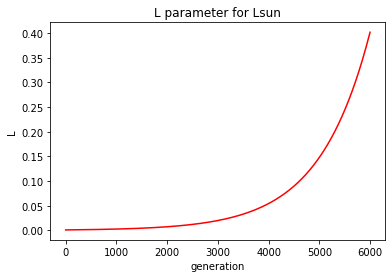

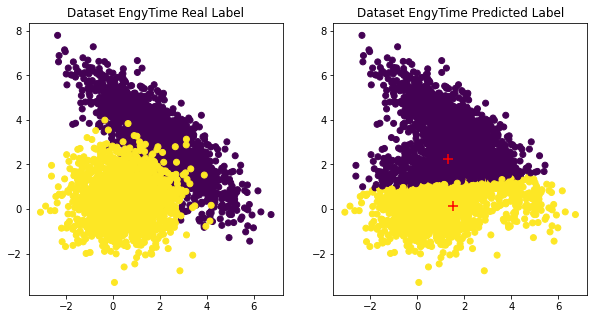

dataset EngyTime --- execution time: 63.83228898048401 seconds --- 
dataset EngyTime --- rand index score: 0.691894769726801 seconds --- 
final cost function J= 8004.969964407423


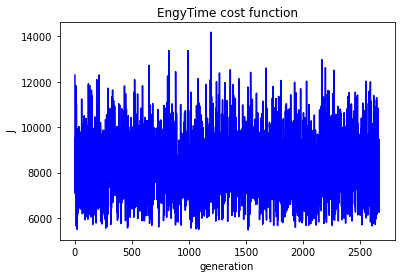

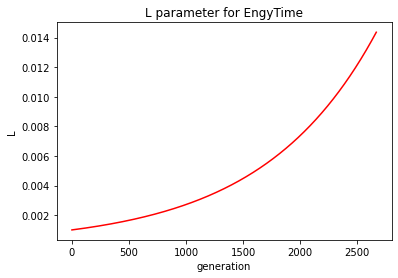

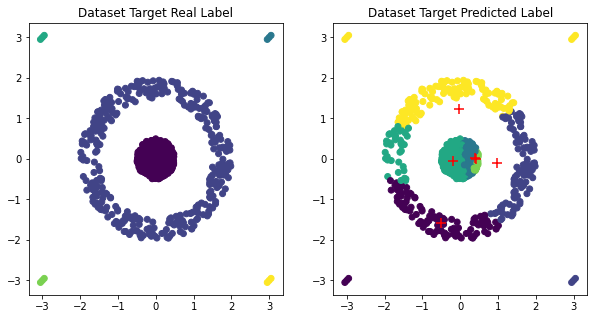

dataset Target --- execution time: 74.36067605018616 seconds --- 
dataset Target --- rand index score: 0.6652694509651597 seconds --- 
final cost function J= -215.07816337452869


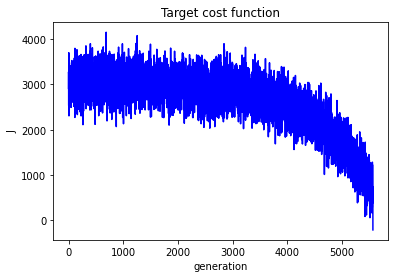

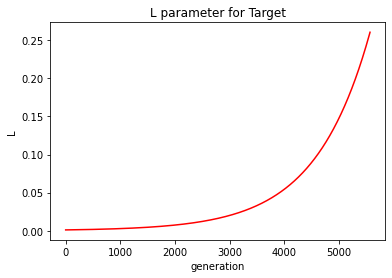

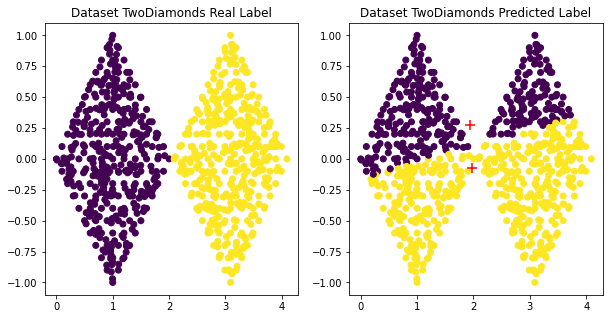

dataset TwoDiamonds --- execution time: 12.90450668334961 seconds --- 
dataset TwoDiamonds --- rand index score: 0.5214518147684606 seconds --- 
final cost function J= 962.3447702500212


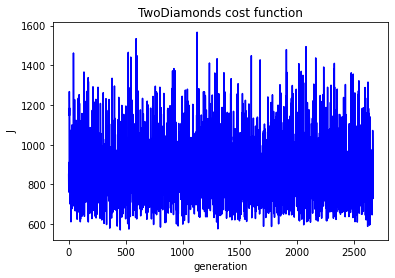

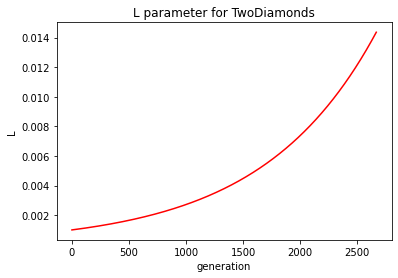

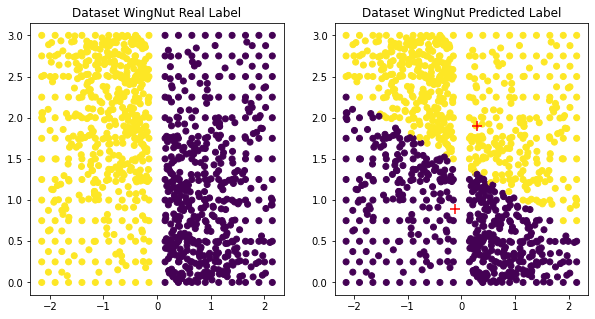

dataset WingNut --- execution time: 16.493896961212158 seconds --- 
dataset WingNut --- rand index score: 0.5077014080136535 seconds --- 
final cost function J= 1046.2294135380425


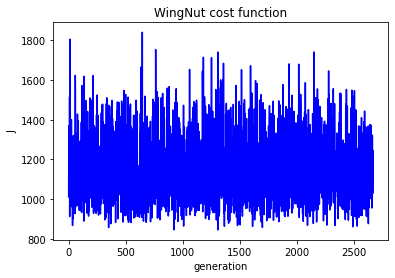

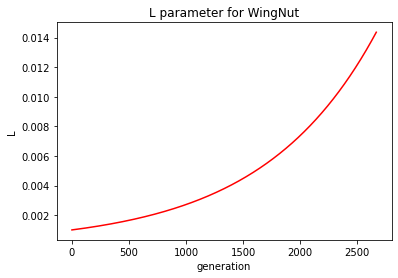

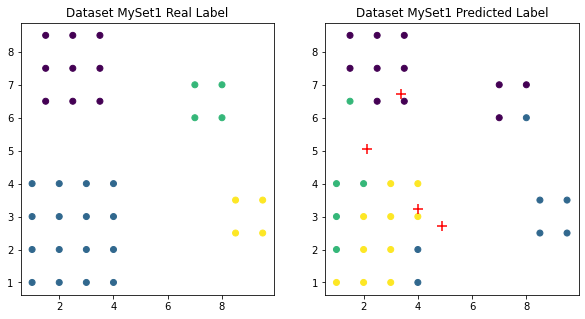

dataset MySet1 --- execution time: 10.017223358154297 seconds --- 
dataset MySet1 --- rand index score: 0.7708333333333334 seconds --- 
final cost function J= -7.553812160875381


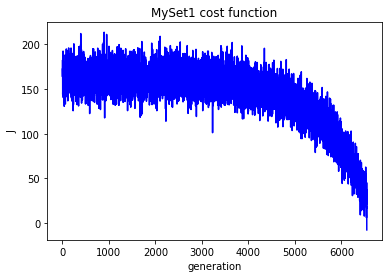

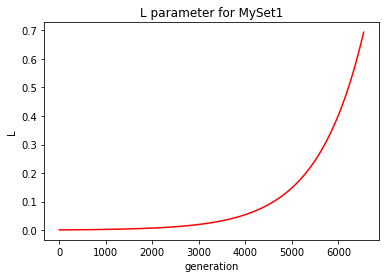

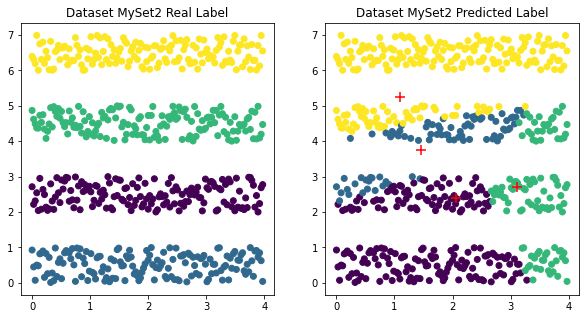

dataset MySet2 --- execution time: 46.92917275428772 seconds --- 
dataset MySet2 --- rand index score: 0.7722982749026155 seconds --- 
final cost function J= -4.757541580917405


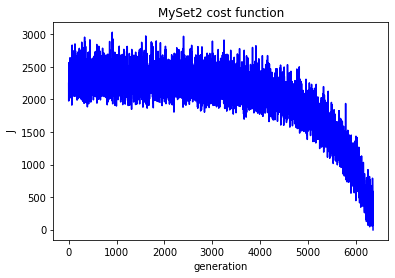

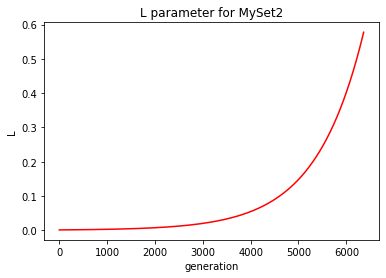

10


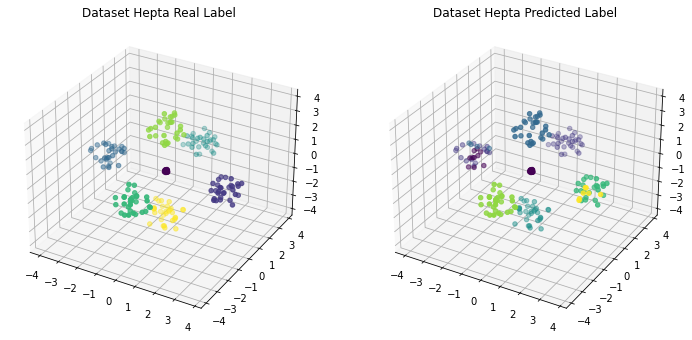

dataset Hepta --- execution time: 32.86626887321472 seconds --- 
dataset Hepta --- rand index score: 0.9398640794062416 seconds --- 
final cost function J= -19.80051211064142


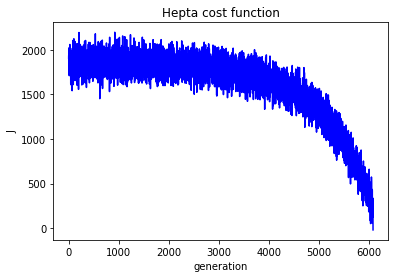

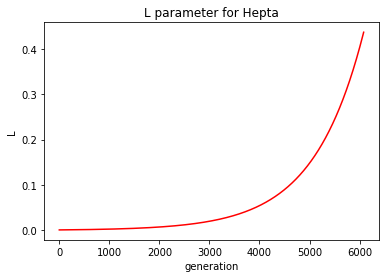

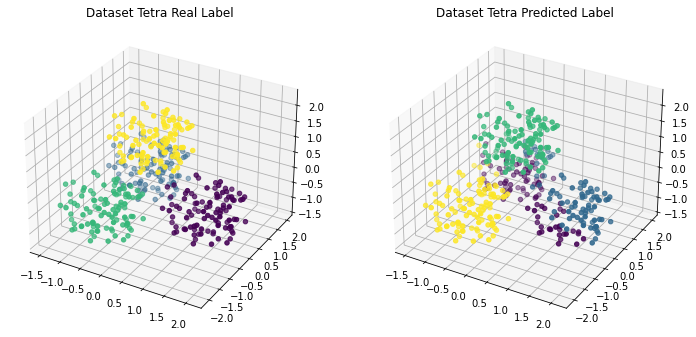

dataset Tetra --- execution time: 30.68619656562805 seconds --- 
dataset Tetra --- rand index score: 0.8794611528822055 seconds --- 
final cost function J= -2.6323739699985254


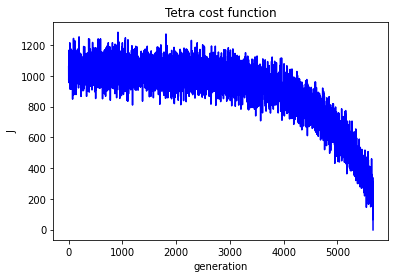

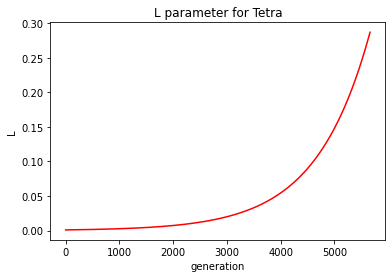

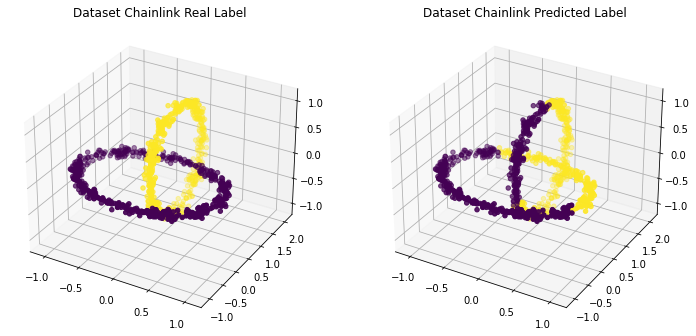

dataset Chainlink --- execution time: 35.362459897994995 seconds --- 
dataset Chainlink --- rand index score: 0.5488468468468468 seconds --- 
final cost function J= 730.7275370254672


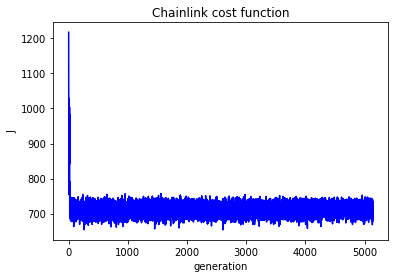

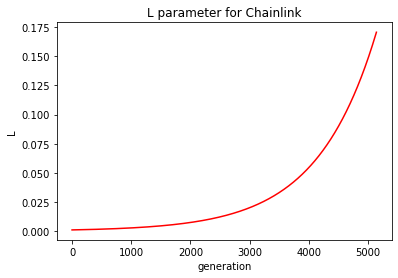

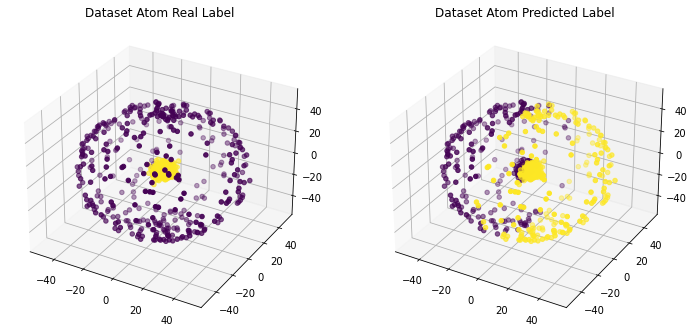

dataset Atom --- execution time: 28.707308292388916 seconds --- 
dataset Atom --- rand index score: 0.5095400500625782 seconds --- 
final cost function J= 14493.045121147748


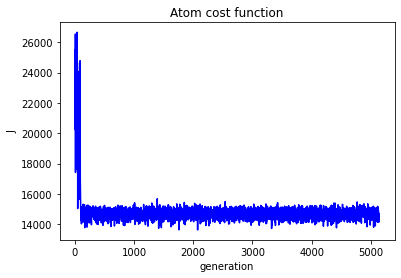

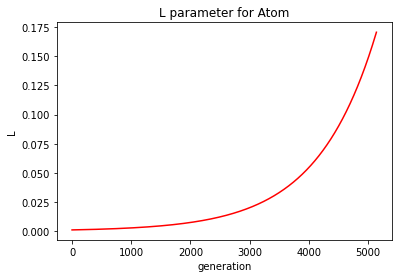

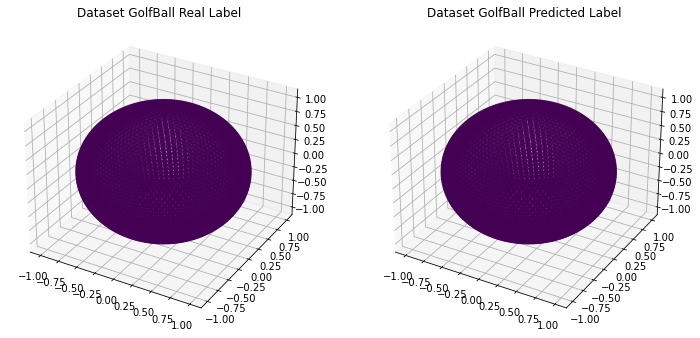

dataset GolfBall --- execution time: 18.99379277229309 seconds --- 
dataset GolfBall --- rand index score: 1.0 seconds --- 
final cost function J= 1353.71104586943


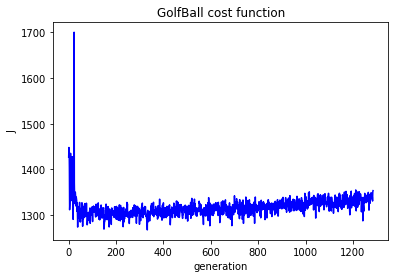

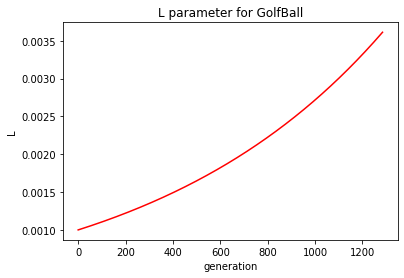

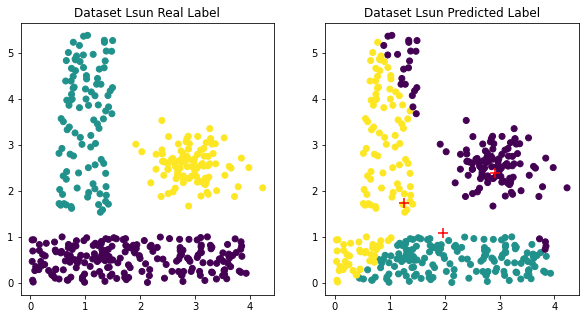

dataset Lsun --- execution time: 26.22340750694275 seconds --- 
dataset Lsun --- rand index score: 0.8143734335839599 seconds --- 
final cost function J= 261.88176218323554


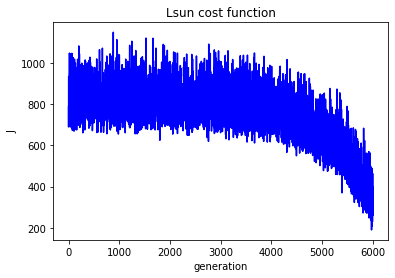

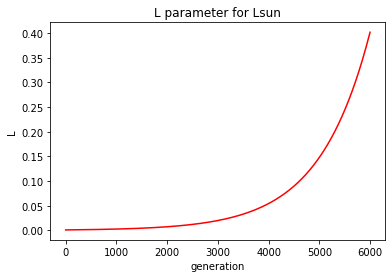

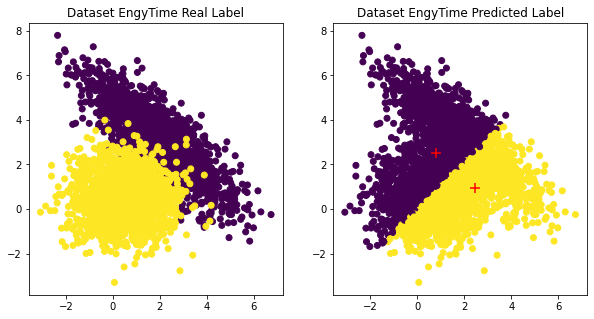

dataset EngyTime --- execution time: 63.16215419769287 seconds --- 
dataset EngyTime --- rand index score: 0.513661858974359 seconds --- 
final cost function J= 9014.765947608015


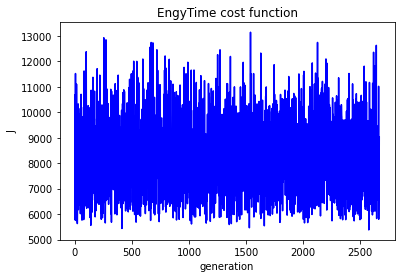

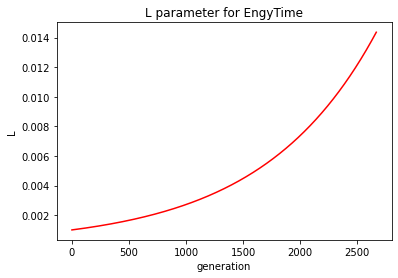

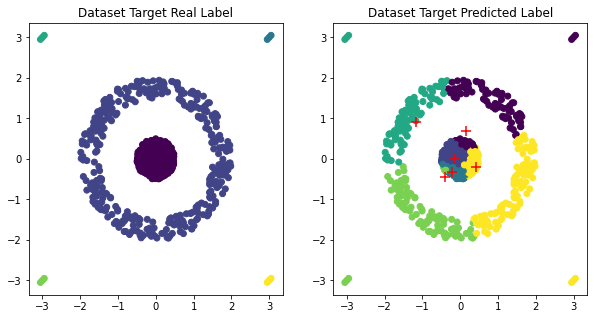

dataset Target --- execution time: 70.67165994644165 seconds --- 
dataset Target --- rand index score: 0.5923564082211676 seconds --- 
final cost function J= -64.75712031136504


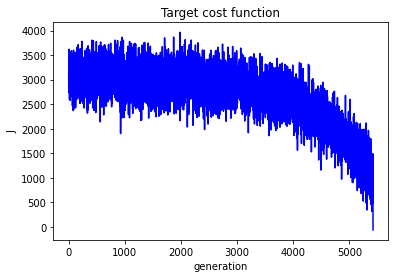

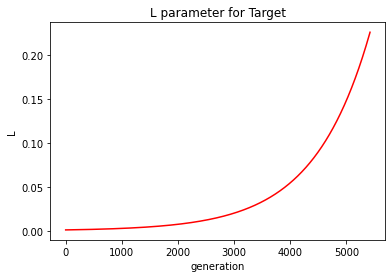

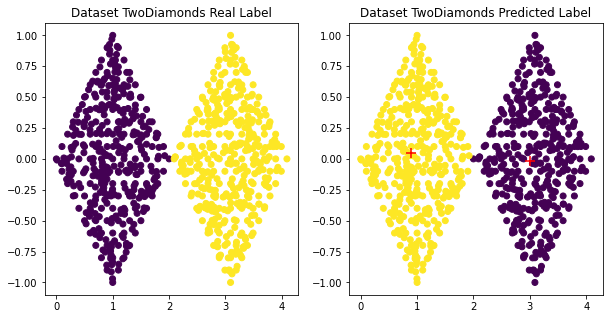

dataset TwoDiamonds --- execution time: 12.73004150390625 seconds --- 
dataset TwoDiamonds --- rand index score: 0.9975 seconds --- 
final cost function J= 875.2898246922006


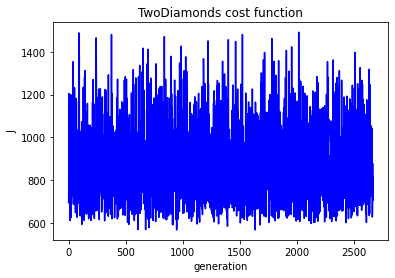

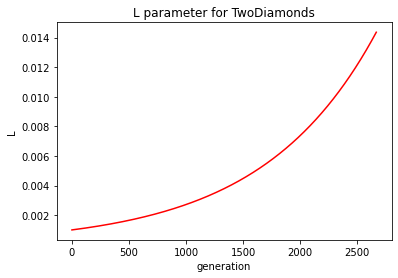

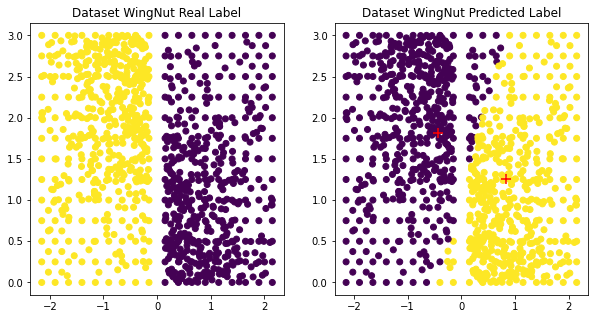

dataset WingNut --- execution time: 15.918412685394287 seconds --- 
dataset WingNut --- rand index score: 0.9242853264031651 seconds --- 
final cost function J= 1247.5919080057245


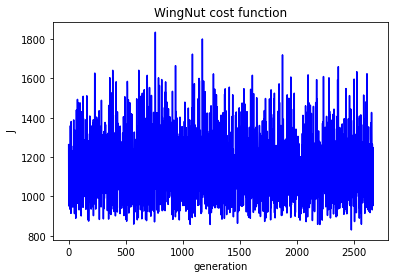

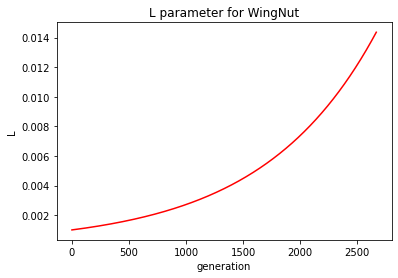

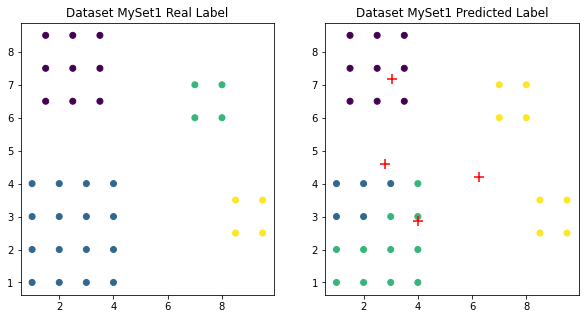

dataset MySet1 --- execution time: 10.375240087509155 seconds --- 
dataset MySet1 --- rand index score: 0.865530303030303 seconds --- 
final cost function J= -4.817216859511461


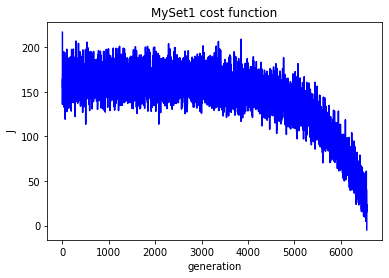

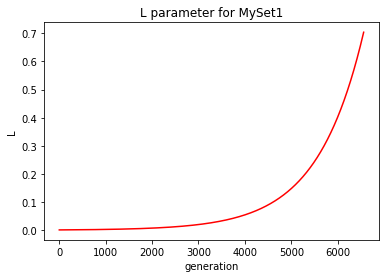

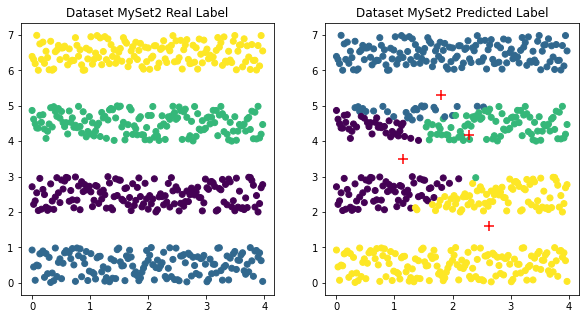

dataset MySet2 --- execution time: 46.30906105041504 seconds --- 
dataset MySet2 --- rand index score: 0.8259821925431274 seconds --- 
final cost function J= -18.114827520480276


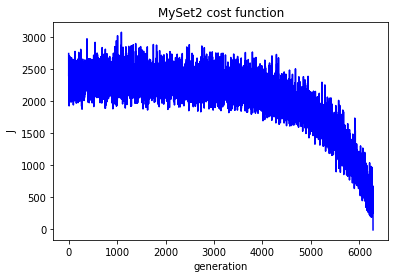

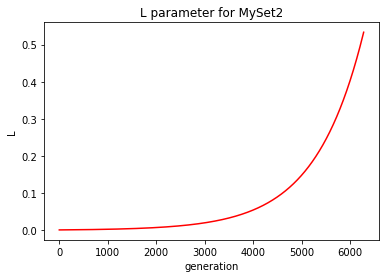

In [237]:
for it in range(10):
    print(it + 1)
    for i in range(len(datasets)):
        dataset = datasets[i]
        n_cluster = n_clusters[i]
        label = labels[i].label.to_numpy()
        start_time = time.time()
        fcm = FCM(n_clusters=n_clusters[i], m=2)
        J, j, L = fcm.fit(datasets[i].to_numpy())
        fcm_centers = fcm.centers
        predict = fcm.predict(dataset.to_numpy())
        execution_time = time.time() - start_time
        if i < 5:
            visualize_result(dataset, n_cluster, label, predict, projection='3d')
        else:
            visualize_result(dataset, n_cluster, label, predict, centers=fcm_centers)
        print('dataset '+ dataset.name +" --- execution time: %s seconds --- " % (execution_time))
        print('dataset '+ dataset.name +" --- rand index score: %s seconds --- " % (rand_score(label, predict)))
        visualize_cost_function(J, j, dataset.name)
        visualize_cost_function(L, 0, dataset.name)
        log_result(dataset.name, execution_time, rand_score(label, predict), j)